In [399]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pandas.api.types import is_numeric_dtype

In [400]:
!pip install tensorflow

In [401]:
import tensorflow as tf

In [402]:
!pip install keras

In [403]:
!pip install scikeras

In [404]:
import keras
from keras.layers import Input
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
# from keras.layers import Flatten
# from keras.layers.convolutional import Conv1D
# from keras.layers.convolutional import MaxPooling1D
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [405]:
import sklearn
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

In [406]:
!pip install livelossplot
from livelossplot.tf_keras import PlotLossesCallback

In [407]:
!pip install shap
import shap

In [408]:
from google.cloud import bigquery

---------

### Authentication for working from Google Colab

In [409]:
# from google.colab import auth
# auth.authenticate_user()

---------

### Destination to save trained models

#### Google disk

In [410]:
# from google.colab import drive

# drive.mount('/content/gdrive')
# project_folder_path = '/content/gdrive/Shareddrives/Magisterka/PROJEKT/'
# models_path = project_folder_path + '/models'

#### Vertex AI Jupyter Lab

In [411]:
data_analysis_folder_path = '../'
models_path = data_analysis_folder_path + '/models'

---------

### Connect to Bigquery service

In [412]:
project_id = "master-thesis-2023-393813" # Fill project id
bqclient = bigquery.Client(project_id)

## Loading data

In [413]:
dataset_name = "twitbot_22_preprocessed_common_users_ids" #"twitbot_22_preprocessed"
users_table_name = "users_with_country"
BQ_TABLE_USERS = dataset_name + "." + users_table_name
table_id = project_id + "." + BQ_TABLE_USERS

In [414]:
job_config = bigquery.QueryJobConfig(
    allow_large_results=True, destination=table_id, use_legacy_sql=True
)

In [415]:
SQL_QUERY = f"""WITH 
  human_records AS (
    SELECT *, ROW_NUMBER() OVER () row_num 
    FROM {BQ_TABLE_USERS}
    WHERE label = 'human' 
    LIMIT 5000),
  bot_records AS (
  SELECT *, ROW_NUMBER() OVER () row_num 
    FROM {BQ_TABLE_USERS}
    WHERE label = 'bot' 
    LIMIT 5000)
  SELECT * FROM human_records 
    UNION ALL SELECT * 
    FROM bot_records 
    ORDER BY row_num;"""

users_df1 = bqclient.query(SQL_QUERY).to_dataframe()
users_df1 = users_df1.drop(['row_num'], axis=1)

In [416]:
# LIMIT RESULTS OPTIONS
pd.set_option('display.max_rows', 100)
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_column', None)
pd.set_option('display.max_colwidth', None)

In [417]:
num_bots = len(users_df1.loc[users_df1['label']=='bot'])       # bots number
num_humans = len(users_df1.loc[users_df1['label']=='human'])   # humans number

print("Number of real users: ", num_humans)
print("Number of bots: ", num_bots)

Number of real users:  5000
Number of bots:  5000


In [418]:
org_users_df = pd.DataFrame(users_df1).copy()
users_df2 = pd.DataFrame(org_users_df).copy()

#### Filter to have same number of record for each class - part I (second part after data analysis and reducing some of outliers)

In [419]:
def filter_df_for_balanced_classes(df, bot_label_value='bot', human_label_value='human'):
    new_df = pd.DataFrame()

    i = 0 # bots iter.
    j = 0 # humans iter.
    k = 0
    num_bots = len(df.loc[df['label']==bot_label_value])
    num_humans = len(df.loc[df['label']==human_label_value])
    max_num = min(num_bots, num_humans)
    for index, record in df.iterrows():
      if k < (2*max_num):
        if record['label']==bot_label_value and i < max_num:
          new_df = new_df.append(record)
          # users_df = pd.concat([users_df, record], ignore_index=True)
          i += 1
          k += 1
        if record['label']==human_label_value and j < max_num:
          new_df = new_df.append(record)
          # users_df = pd.concat([users_df, record], ignore_index=True)
          j += 1
          k += 1
            
    print("Number of bots: ", len(new_df.loc[new_df['label']==bot_label_value]))
    print("Number of human users: ", len(new_df.loc[new_df['label']==human_label_value]))
    
    return pd.DataFrame(new_df).copy();

In [420]:
users_df = filter_df_for_balanced_classes(users_df2)

Number of bots:  5000
Number of human users:  5000


## Data preparation

In [421]:
def drop_columns(df, columns):
    for column_name in columns:
      df = df.drop([column_name], axis=1)
    return df

In [422]:
def encode_not_numeric_columns(df):
  for column_name in df:
    if not is_numeric_dtype(df[column_name]):
      unique_values_dict = dict(enumerate(df[column_name].unique()))
      unique_values_dict = dict((v, k) for k, v in unique_values_dict.items())
      df[column_name] = df[column_name].map(unique_values_dict)
  return df

#### Align values for bool columns

In [423]:
boolean_columns = ["verified", "protected", "withheld", "has_location", "has_profile_image_url", "has_pinned_tweet", "has_description"]

In [424]:
# Firstly align boolean columns values
for col_name in boolean_columns:
    users_df[col_name] = users_df[col_name].astype(bool)

column_to_remove = []
# Check unique values (some of subset can have only one unique value for some feature) if so it column will be removed from dataframe
for col_name in boolean_columns:
    uniq_val_list = users_df[col_name].unique()
    print("Column {:<24} {}".format(col_name, str(uniq_val_list)))
    if (len(uniq_val_list) < 2):
        column_to_remove.append(col_name)

Column verified                 [False  True]
Column protected                [False  True]
Column withheld                 [False]
Column has_location             [ True False]
Column has_profile_image_url    [ True False]
Column has_pinned_tweet         [False  True]
Column has_description          [ True False]


In [425]:
column_to_remove

['withheld']

In [426]:
# remove from bool columns:
for col_name in column_to_remove:
    boolean_columns.remove(col_name)
# remove from dataframe
users_df = drop_columns(users_df, column_to_remove)

### Encoding of non-numeric information which will be used by model

In [427]:
# Remap the values of the dataframe
for col_name in boolean_columns:
  users_df[col_name] = users_df[col_name].map({True:1,False:0})

# Remap label values human/bot for 0/1
label_col = "label"
users_df[label_col] = users_df[label_col].map({"human":0,"bot":1})


### Location mapping

#### Tried some supporting libs:
    - pycountry.countries.search_fuzzy: working not too good with some basic locations 
    - locationtagger: working not too good with some basic locations 
    - geograpy.get_place_context: chosen tool to map location to country
    
Chosen **geograpy3 lib** - mapping moved to preprocessing step - added new columns 'country' and 'country_numeric'

In [428]:
import json
 
with open('./../../data-preprocessing/scripts/users/countries_dict.json') as json_file:
    country_dict = json.load(json_file)

#### Null and NaN statistics

In [429]:
for col_name in users_df:
    count1 = pd.isnull(users_df[col_name]).sum()
    print(col_name + ": " + str(count1))

id: 0
label: 0
username: 0
name: 0
created_at: 0
verified: 0
protected: 0
has_location: 0
location: 3476
has_profile_image_url: 0
has_pinned_tweet: 0
url: 0
followers_count: 0
following_count: 0
tweet_count: 0
listed_count: 0
has_description: 0
description: 0
descr_no_hashtags: 0
descr_no_cashtags: 0
descr_no_mentions: 0
descr_no_urls: 0
url_no_urls: 0
country: 0
country_numeric: 0


#### Extract some information from dataframe to new columns

##### Description length

In [430]:
users_df['descr_len'] = users_df['description'].apply(len).astype(float)

##### Account age (in days) (sice 16.03.2022) (dataset data collected during the 20/01-15/03/2022 period)

In [431]:
from datetime import datetime

In [432]:
def cal_days_diff(a,b):
    A = a.replace(hour = 0, minute = 0, second = 0, microsecond = 0)
    B = b.replace(hour = 0, minute = 0, second = 0, microsecond = 0)
    return (A - B).days

def convert_unixtime_to_datetime(a):
    return datetime.utcfromtimestamp(a)

In [433]:
base_date = datetime(2022, 3, 16)
users_df['account_age'] = users_df.apply(lambda x: cal_days_diff(base_date, convert_unixtime_to_datetime(x.created_at)), axis=1).astype(float)

#### Reduce unnecessary columns

In [434]:
users_reduced_df = pd.DataFrame(users_df).copy()
# columns_to_drop = ["id", "username", "name", "created_at", "location", "url", "description"]
columns_to_drop = ["username", "name", "created_at", "location", "url", "description", 'country']
users_reduced_df = drop_columns(users_reduced_df, columns_to_drop)
users_reduced_df

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
0,1428769922507751429,1,0,0,1,1,0,2.0,41.0,1.0,0.0,1,0.0,0.0,0.0,0.0,1.0,81.0,160.0,208.0
1,1484544053572419585,0,0,0,1,1,0,0.0,24.0,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,170.0,72.0,54.0
2,842202106324951040,1,0,0,1,1,0,3.0,22.0,4.0,0.0,0,0.0,0.0,0.0,0.0,0.0,16.0,0.0,1826.0
3,1447956502443069446,0,0,0,1,1,0,0.0,20.0,1.0,0.0,1,1.0,0.0,0.0,0.0,0.0,1.0,85.0,155.0
4,21309002,1,0,0,1,1,0,3.0,42.0,2.0,0.0,0,0.0,0.0,0.0,0.0,0.0,81.0,0.0,4773.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,3275187061,0,0,0,1,1,1,352.0,190.0,1094.0,18.0,1,5.0,0.0,0.0,0.0,1.0,16.0,156.0,2440.0
9996,1485289449487572996,1,0,0,0,1,0,0.0,34.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,1.0,5.0,52.0
9997,1215382704876871680,0,0,0,1,1,0,608.0,1265.0,1095.0,11.0,1,0.0,0.0,1.0,0.0,1.0,1.0,153.0,797.0
9998,1480725883820208131,1,0,0,0,1,0,0.0,5.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,64.0


### Data type conversion (to float)

In [435]:
for (column_name, column_data) in users_reduced_df.iteritems():
    users_reduced_df[column_name] = users_reduced_df[column_name].astype(float)

### Data split for training, validation and testing

In [436]:
train_data, test_data = train_test_split(users_reduced_df, test_size=0.30, random_state=25, shuffle=True)
test_data, val_data = train_test_split(test_data, test_size=0.5, random_state=25, shuffle=True)

### Create same dataframe for validation and test set to work with based on outliers analysis (done in later part)

In [437]:
val_data_wo_outliers = pd.DataFrame(val_data).copy()
test_data_wo_outliers = pd.DataFrame(test_data).copy()

### Describe trainig dataset

In [438]:
train_data.describe()

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
count,7.000000e+03,7000.000000,7000.000000,7000.000000,7000.000000,7000.0,7000.000000,7.000000e+03,7000.000000,7.000000e+03,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000
mean,5.543646e+17,0.503857,0.043429,0.002143,0.655000,1.0,0.215714,6.229971e+03,1253.036286,6.554910e+03,84.518000,0.798857,0.407571,0.004286,0.340000,0.082857,0.555571,78.490000,84.592000,2442.663000
std,6.098100e+17,0.500021,0.203834,0.046245,0.475402,0.0,0.411346,4.412925e+04,6121.951212,3.316229e+04,394.414956,0.400883,1.350239,0.162084,0.895034,0.330811,0.496938,95.261335,59.651674,1640.465006
min,9.530000e+02,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,22.000000
25%,2.792374e+08,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,3.300000e+01,74.000000,2.200000e+01,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,23.000000,818.000000
50%,3.399836e+09,1.000000,0.000000,0.000000,1.000000,1.0,0.000000,2.710000e+02,269.000000,5.015000e+02,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,18.000000,95.000000,2407.000000
75%,1.207494e+18,1.000000,0.000000,0.000000,1.000000,1.0,0.000000,1.565500e+03,899.000000,3.310500e+03,36.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,165.000000,143.000000,3995.000000
max,1.495955e+18,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.730667e+06,244195.000000,1.184641e+06,14386.000000,1.000000,17.000000,11.000000,12.000000,4.000000,1.000000,250.000000,243.000000,5724.000000


#### Describes training data for bots

In [439]:
train_data.loc[train_data['label']==1].describe()

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
count,3.527000e+03,3527.0,3527.0,3527.000000,3527.000000,3527.0,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000,3527.000000
mean,6.799368e+17,1.0,0.0,0.001985,0.542671,1.0,0.157925,2016.999716,770.499008,2185.104338,26.952935,0.666856,0.368018,0.007088,0.248653,0.062376,0.450525,64.706549,67.609300,2060.185143
std,6.153791e+17,0.0,0.0,0.044512,0.498247,0.0,0.364722,19503.794857,4195.024713,11279.654017,147.438461,0.471404,1.332681,0.212234,0.763409,0.296643,0.497617,90.292452,62.244412,1565.122289
min,9.280410e+05,1.0,0.0,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,30.000000
25%,8.678293e+08,1.0,0.0,0.000000,0.000000,1.0,0.000000,14.000000,41.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,604.000000
50%,8.605276e+17,1.0,0.0,0.000000,1.000000,1.0,0.000000,81.000000,140.000000,127.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,58.000000,1776.000000
75%,1.285165e+18,1.0,0.0,0.000000,1.000000,1.0,0.000000,410.000000,431.000000,1086.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,106.000000,134.000000,3446.500000
max,1.493160e+18,1.0,0.0,1.000000,1.000000,1.0,1.000000,702018.000000,150720.000000,497641.000000,5344.000000,1.000000,16.000000,11.000000,8.000000,4.000000,1.000000,249.000000,243.000000,5484.000000


#### Describes training data for humans

In [440]:
train_data.loc[train_data['label']==0].describe()

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
count,3.473000e+03,3473.0,3473.000000,3473.000000,3473.000000,3473.0,3473.000000,3.473000e+03,3473.000000,3.473000e+03,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000,3473.000000
mean,4.268398e+17,0.0,0.087532,0.002303,0.769076,1.0,0.274403,1.050845e+04,1743.076303,1.099266e+04,142.978117,0.932911,0.447740,0.001440,0.432767,0.103657,0.662252,92.487763,101.838756,2831.087820
std,5.768540e+17,0.0,0.282654,0.047946,0.421485,0.0,0.446277,5.918594e+04,7563.173323,4.526135e+04,533.600601,0.250212,1.366861,0.084843,1.002955,0.361083,0.473010,98.105472,51.457456,1624.084521
min,9.530000e+02,0.0,0.000000,0.000000,0.000000,1.0,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,22.000000
25%,1.374800e+08,0.0,0.000000,0.000000,1.000000,1.0,0.000000,1.570000e+02,159.000000,1.700000e+02,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,63.000000,1343.000000
50%,1.900708e+09,0.0,0.000000,0.000000,1.000000,1.0,0.000000,9.130000e+02,499.000000,1.578000e+03,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,43.000000,115.000000,3094.000000
75%,1.017309e+18,0.0,0.000000,0.000000,1.000000,1.0,1.000000,3.610000e+03,1413.000000,6.601000e+03,91.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,236.000000,149.000000,4342.000000
max,1.495955e+18,0.0,1.000000,1.000000,1.000000,1.0,1.000000,1.730667e+06,244195.000000,1.184641e+06,14386.000000,1.000000,17.000000,5.000000,12.000000,3.000000,1.000000,250.000000,181.000000,5724.000000


# Data analysis

In [441]:
def get_dataframe_real_indexes(df, outliers_index_list):
    real_all_indexes = train_data.loc[train_data['label']==1].index
    oder_indexes = np.arange(len(real_all_indexes)) 

    indexes_df = pd.DataFrame({'real_index' : real_all_indexes, 'order_index' : oder_indexes})
    return list(indexes_df[indexes_df.order_index.isin(outliers_index_list)]['real_index'])

In [442]:
def outliers_KNN(data, column_name, n_neighbors=10, radius=5, title="", r1=48, r2=90, w=900, h=500, ydtick=2, xdtick=2, nbins=20,  th = 0.9):

    np.set_printoptions(threshold=np.inf)

    # create model
    nbrs = NearestNeighbors(n_neighbors = n_neighbors, radius=radius)
    # fit model
    data_2d = [ [ 0., x] for x in data[column_name].values]
    nbrs.fit(data_2d)

    neighbors_and_distances = nbrs.kneighbors(data_2d)
    distances = neighbors_and_distances[0]
    neighbors = neighbors_and_distances[1]
    # print(neighbors_and_distances[1])

    plt.figure(figsize=(15, 7))
    # plt.plot(distances.mean(axis=1))

    distances = pd.DataFrame(distances)
    distances_mean = pd.DataFrame(distances).mean(axis =1)
    # distances_mean.describe()
    
    outliers_index = np.where(distances_mean > th) 
    outliers_index = list(outliers_index)[0]
    outliers_index = [outliers_index[i] for i in range(len(outliers_index))]
    outliers_index_with_column_name = [[indx, data[column_name].values[indx]] for indx in outliers_index]
    outliers_index_sorted_by_column_name = sorted(outliers_index_with_column_name,key=lambda x: x[1])

    outliers = list(dict(outliers_index_sorted_by_column_name).values())
    outliers_indexes = list(dict(outliers_index_sorted_by_column_name).keys())

    print("Number of outliers: ", len(outliers))

    fig = make_subplots(specs=[[{"secondary_y": True}]])

    trace1 = go.Histogram(
            x=data[column_name],
            name=column_name,
            nbinsx=nbins,
            opacity=0.7,
    )
    trace2 = go.Histogram(
        x=outliers,
        nbinsx=nbins,
        # histnorm='density',
        name='outliers',
        opacity=0.7
    )

    traces = [trace1, trace2]
    layout = go.Layout(barmode='overlay')
    # layout = go.Layout()
    fig = go.Figure(data=traces, layout=layout)
    fig.update_layout(
        title_text=title, # title f plot
        xaxis_title_text='value', # xaxis label
        yaxis_title_text='frequency', # yaxis label
        bargap=0.05,
        bargroupgap=0.05
    )

    # fig.update_xaxes(dtick=xdtick, range =[r1,r2])
    # fig.update_yaxes(dtick=ydtick)
    fig.update_layout(
        width=w,
        height=h)
    fig.show()
    
    return get_dataframe_real_indexes(data, outliers_index)

## Distribution of label class in training, validation and test set

In [443]:
stack_data = {'Set': ['Training data', 'Validation data', 'Test data', 'Training data', 'Validation data', 'Test data'],
              'Label': ['Bot', 'Bot', 'Bot', 'Human', 'Human', 'Human'],
              'Freq': [len(train_data.loc[train_data['label']==1]), 
                       len(val_data.loc[val_data['label']==1]), 
                       len(test_data.loc[test_data['label']==1]),
                       len(train_data.loc[train_data['label']==0]), 
                       len(val_data.loc[val_data['label']==0]), 
                       len(test_data.loc[test_data['label']==0])]}
sdf = pd.DataFrame(stack_data)
sdf

,Set,Label,Freq
0,Training data,Bot,3527
1,Validation data,Bot,743
2,Test data,Bot,730
3,Training data,Human,3473
4,Validation data,Human,757
5,Test data,Human,770


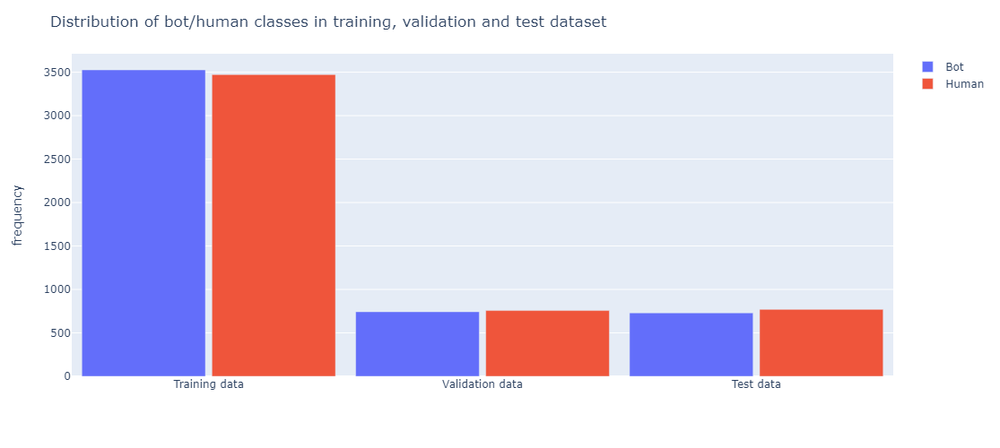

In [444]:
fig = px.bar(sdf, x="Set", y="Freq",
             color="Label", hover_data=['Label'],
             barmode = 'group')
fig.update_layout(
    title_text='Distribution of bot/human classes in training, validation and test dataset',
    xaxis_title_text='', #'subset',
    yaxis_title_text='frequency',
    bargap=0.05,
    bargroupgap=0.05,
    width=700,
    height=500,
    legend={"title":""})
fig.show()

## Distribution of other features in training dataset

### ['verified', 'protected', 'has_location', 'has_profile_image_url', 'has_pinned_tweet', 'has_description']

In [445]:
train_bot_data = train_data.loc[train_data['label']==1]
train_human_data = train_data.loc[train_data['label']==0]

# stack_bool_training_feature_data = {'Feature': ['verified', 'protected', 'has_location', 'has_profile_image_url', 'has_pinned_tweet', 'has_description']*4,
#     'Label': ['Bot']*12 + ['Human']*12,
#     'Value': [True]*6 + [False]*6 + [True]*6 + [False]*6,
stack_bool_training_feature_data = {'Feature': ['verified', 'has_pinned_tweet', 'has_description']*4,
    'Label': ['Bot']*6 + ['Human']*6,
    'Value': [True]*3 + [False]*3 + [True]*3 + [False]*3,
    'Freq': [len(train_bot_data.loc[train_bot_data['verified']==1]), 
             # len(train_bot_data.loc[train_bot_data['protected']==1]), 
             # len(train_bot_data.loc[train_bot_data['has_location']==1]),
             # len(train_bot_data.loc[train_bot_data['has_profile_image_url']==1]), 
             len(train_bot_data.loc[train_bot_data['has_pinned_tweet']==1]), 
             len(train_bot_data.loc[train_bot_data['has_description']==1]),
             len(train_bot_data.loc[train_bot_data['verified']==0]), 
             # len(train_bot_data.loc[train_bot_data['protected']==0]), 
             # len(train_bot_data.loc[train_bot_data['has_location']==0]),
             # len(train_bot_data.loc[train_bot_data['has_profile_image_url']==0]), 
             len(train_bot_data.loc[train_bot_data['has_pinned_tweet']==0]), 
             len(train_bot_data.loc[train_bot_data['has_description']==0]),
             len(train_human_data.loc[train_human_data['verified']==1]), 
             # len(train_human_data.loc[train_human_data['protected']==1]), 
             # len(train_human_data.loc[train_human_data['has_location']==1]),
             # len(train_human_data.loc[train_human_data['has_profile_image_url']==1]), 
             len(train_human_data.loc[train_human_data['has_pinned_tweet']==1]), 
             len(train_human_data.loc[train_human_data['has_description']==1]),
             len(train_human_data.loc[train_human_data['verified']==0]), 
             # len(train_human_data.loc[train_human_data['protected']==0]), 
             # len(train_human_data.loc[train_human_data['has_location']==0]),
             # len(train_human_data.loc[train_human_data['has_profile_image_url']==0]), 
             len(train_human_data.loc[train_human_data['has_pinned_tweet']==0]), 
             len(train_human_data.loc[train_human_data['has_description']==0])]}

stack_training_bool_feature_df = pd.DataFrame(stack_bool_training_feature_data)

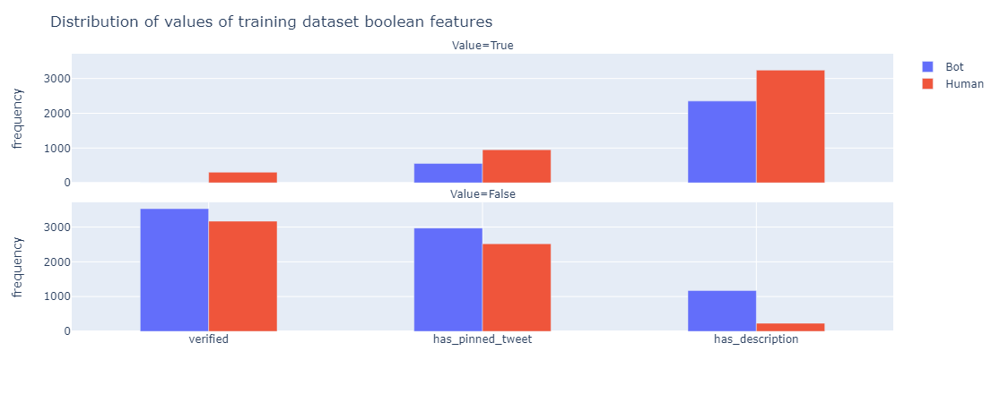

In [446]:
fig = px.bar(stack_training_bool_feature_df, 
               x="Feature", 
               y="Freq",
               facet_col="Value",
               facet_col_wrap = 1,
               color="Label", hover_data=['Label'],
               barmode = 'group')
fig.update_layout(
    title_text='Distribution of values of training dataset boolean features',
    xaxis_title_text='', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True))

fig.update_yaxes(row=2, col=1, title='frequency')
fig.show()

### followers_count

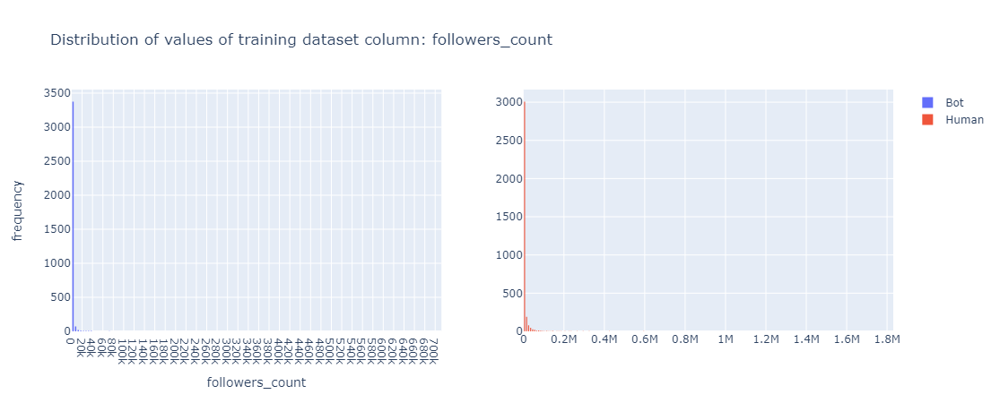

In [447]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: followers_count',
    xaxis_title_text='followers_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True,title='followers_count', dtick=20000, range=[0, max(train_data.loc[train_data['label']==1,'followers_count'])+10000]),
    xaxis2=dict(showgrid=True, dtick=200000, range=[0, max(train_data.loc[train_data['label']==0,'followers_count'])+100000]),
    yaxis=dict(showgrid=True))

fig.show()

#### followers_count - outliers

##### K-means (mnonot useful)

Number of outliers:  459


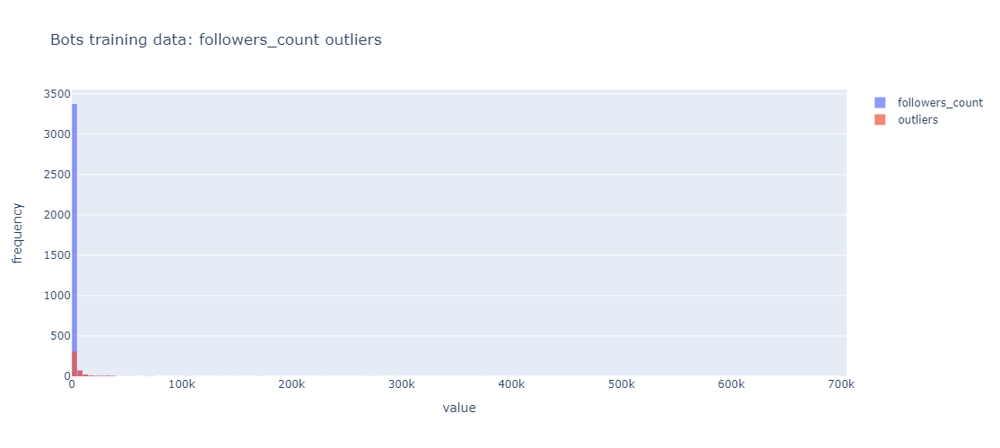

<Figure size 1500x700 with 0 Axes>

In [448]:
followers_count_bots_outliers_indexes = outliers_KNN(train_data.loc[train_data['label']==1], 'followers_count', title = "Bots training data: followers_count outliers", n_neighbors=2, radius=1, nbins=200)

Number of outliers:  1088


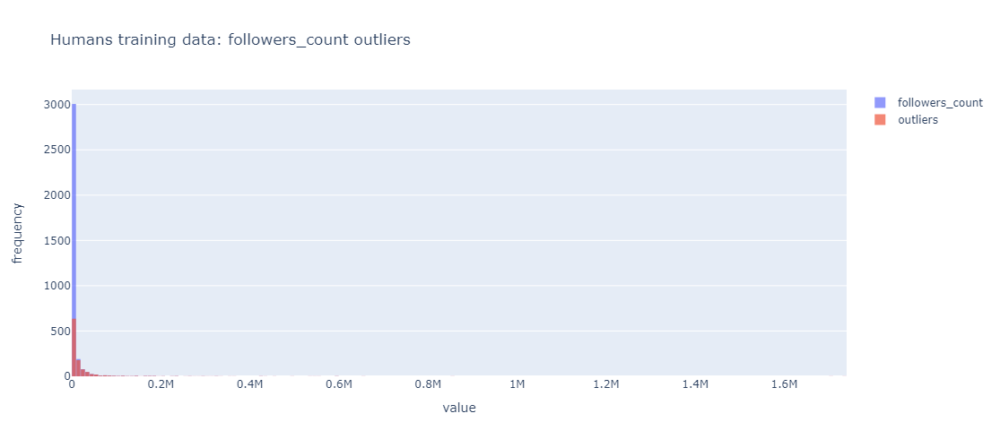

<Figure size 1500x700 with 0 Axes>

In [449]:
followers_count_humans_outliers_indexes = outliers_KNN(train_data.loc[train_data['label']==0], 'followers_count', title = "Humans training data: followers_count outliers", n_neighbors=2, radius=1, nbins=200)

In [450]:
# q_hi_bots = train_data.loc[train_data['label']==1]['followers_count'].quantile(0.99, interpolation='nearest')
# q_hi_humans = train_data.loc[train_data['label']==0]['followers_count'].quantile(0.99, interpolation='nearest')

# df_filtered_bots = train_data.loc[train_data['label']==1][(train_data.loc[train_data['label']==1]['followers_count'] < q_hi_bots)]
# df_filtered_humans = train_data.loc[train_data['label']==0][(train_data.loc[train_data['label']==0]['followers_count'] < q_hi_humans)]

In [451]:
len(train_data[(train_data['label']==1)])

3527

In [452]:
len(train_data[(train_data['label']==0)])

3473

In [453]:
from scipy.stats import expon

# Fit an exponential distribution to data
loc_b, scale_b = expon.fit(train_data.loc[train_data['label']==1]['followers_count'])
loc_h, scale_h = expon.fit(train_data.loc[train_data['label']==0]['followers_count'])

# Calculate the 99th percentile using the percent-point function (inverse CDF)
percentile_99_bots = expon.ppf(0.99, loc=loc_b, scale=scale_b)
percentile_99_humans = expon.ppf(0.99, loc=loc_h, scale=scale_h)
df_reduced_outliers_followers_count = train_data[((train_data['label']==1) & (train_data['followers_count'] < percentile_99_bots)) | ((train_data['label']==0) & (train_data['followers_count'] < percentile_99_humans))]
df_filtered_bots = train_data[(train_data['label']==1) & (train_data['followers_count'] < percentile_99_bots)]
df_filtered_humans = train_data[(train_data['label']==0) & (train_data['followers_count'] < percentile_99_humans)]

In [454]:
def df_99_percentile(df, column_name):
    # Fit an exponential distribution to data
    loc_b, scale_b = expon.fit(df.loc[df['label']==1][column_name])
    loc_h, scale_h = expon.fit(df.loc[df['label']==0][column_name])

    # Calculate the 99th percentile using the percent-point function (inverse CDF)
    percentile_99_bots = expon.ppf(0.99, loc=loc_b, scale=scale_b)
    percentile_99_humans = expon.ppf(0.99, loc=loc_h, scale=scale_h)
    return df[((df['label']==1) & (df[column_name] < percentile_99_bots)) | ((df['label']==0) & (df[column_name] < percentile_99_humans))]

In [455]:
len(df_filtered_bots)

3443

In [456]:
len(df_filtered_humans)

3343

In [457]:
len(df_reduced_outliers_followers_count) 

6786

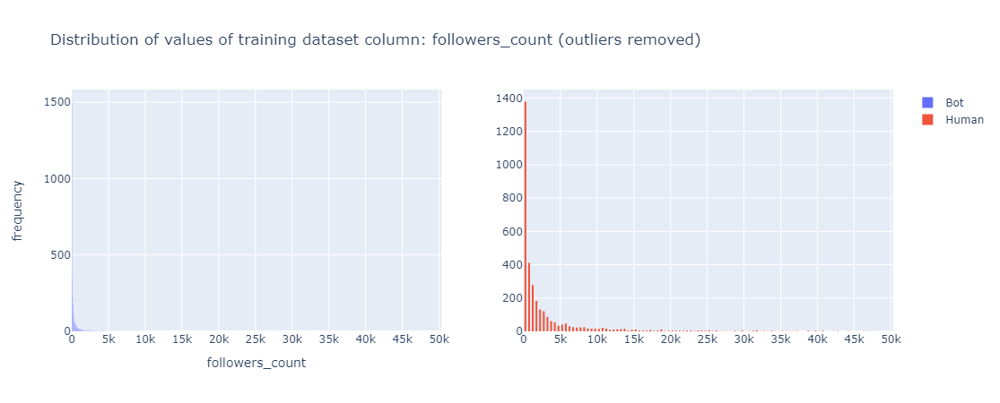

In [458]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_followers_count.loc[df_reduced_outliers_followers_count['label']==1,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_followers_count.loc[df_reduced_outliers_followers_count['label']==0,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: followers_count (outliers removed)',
    xaxis_title_text='followers_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=5000, range=[0, max(df_reduced_outliers_followers_count['followers_count'])+2500]),
    xaxis2=dict(showgrid=True, dtick=5000, range=[0, max(df_reduced_outliers_followers_count['followers_count'])+2500]),
    yaxis=dict(showgrid=True))

fig.show()

#### following_count

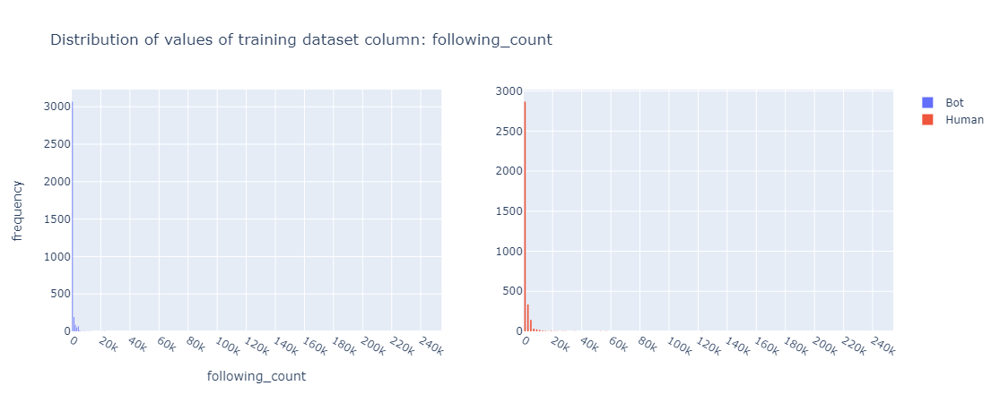

In [459]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: following_count',
    xaxis_title_text='following_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=20000, range=[0, max(train_data['following_count'])+10000]),
    xaxis2=dict(showgrid=True, dtick=20000, range=[0, max(train_data['following_count'])+10000]),
    yaxis=dict(showgrid=True))

fig.show()

#### following_count - outliers

In [460]:
df_reduced_outliers_following_count = df_99_percentile(df=train_data, column_name='following_count')

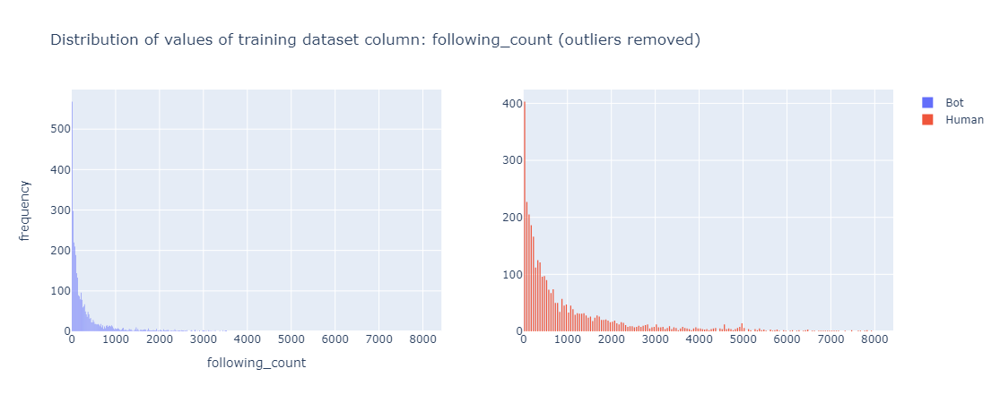

In [461]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_following_count.loc[df_reduced_outliers_following_count['label']==1,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_following_count.loc[df_reduced_outliers_following_count['label']==0,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: following_count (outliers removed)',
    xaxis_title_text='following_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1000, range=[0, max(df_reduced_outliers_following_count['following_count'])+500]),
    xaxis2=dict(showgrid=True, dtick=1000, range=[0, max(df_reduced_outliers_following_count['following_count'])+500]),
    yaxis=dict(showgrid=True))

fig.show()

#### tweet_count

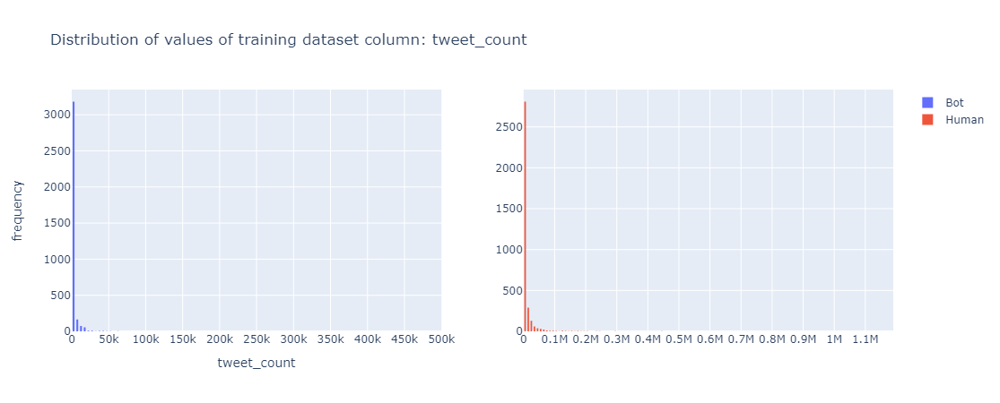

In [462]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: tweet_count',
    xaxis_title_text='tweet_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=50000),
    xaxis2=dict(showgrid=True, dtick=100000),
    yaxis=dict(showgrid=True))

fig.show()

#### tweet_count - outliers

In [463]:
df_reduced_outliers_tweet_count = df_99_percentile(df=train_data, column_name='tweet_count')

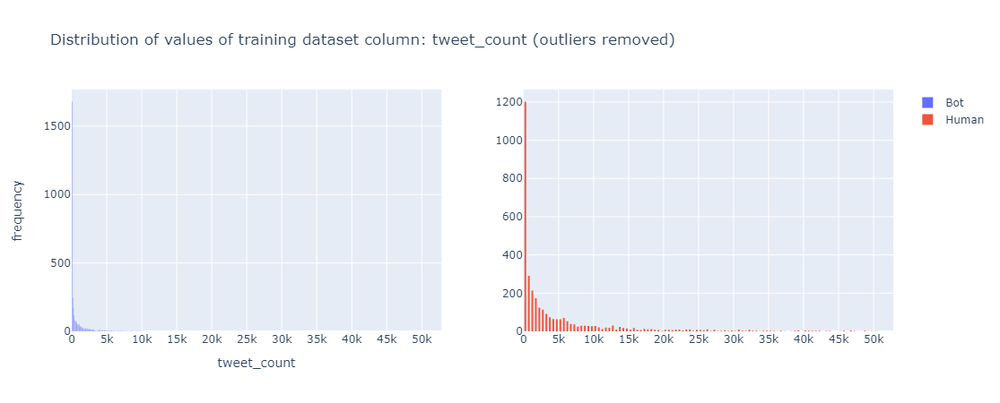

In [464]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_tweet_count.loc[df_reduced_outliers_tweet_count['label']==1,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_tweet_count.loc[df_reduced_outliers_tweet_count['label']==0,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: tweet_count (outliers removed)',
    xaxis_title_text='tweet_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=5000, range=[0, max(df_reduced_outliers_tweet_count['tweet_count'])+2500]),
    xaxis2=dict(showgrid=True, dtick=5000, range=[0, max(df_reduced_outliers_tweet_count['tweet_count'])+2500]),
    yaxis=dict(showgrid=True))

fig.show()

### listed_count

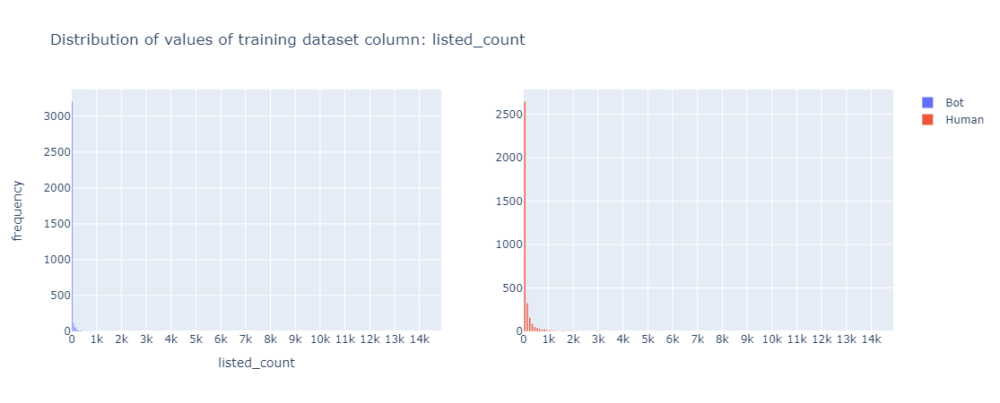

In [465]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: listed_count',
    xaxis_title_text='listed_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1000, range=[0, max(train_data['listed_count'])+500]),
    xaxis2=dict(showgrid=True, dtick=1000, range=[0, max(train_data['listed_count'])+500]),
    yaxis=dict(showgrid=True))

fig.show()

#### listed_count - outliers

In [466]:
df_reduced_outliers_listed_count = df_99_percentile(df=train_data, column_name='listed_count')

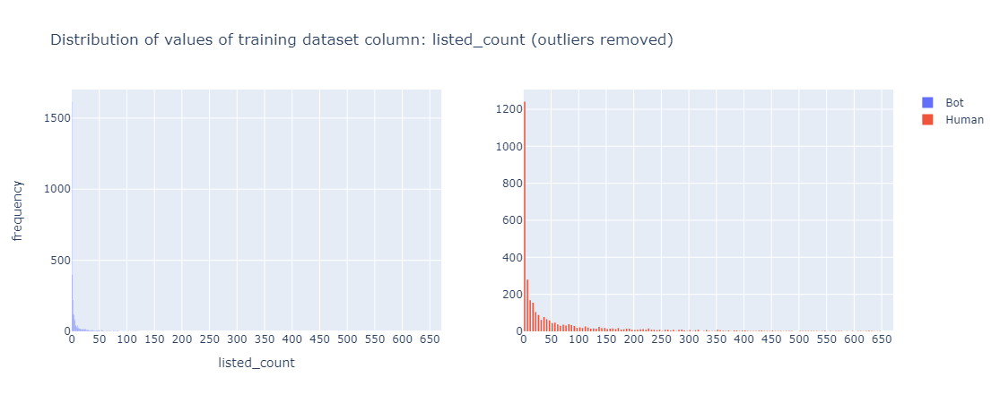

In [467]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_listed_count.loc[df_reduced_outliers_listed_count['label']==1,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_listed_count.loc[df_reduced_outliers_listed_count['label']==0,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: listed_count (outliers removed)',
    xaxis_title_text='listed_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=50, range=[0, max(df_reduced_outliers_listed_count['listed_count'])+25]),
    xaxis2=dict(showgrid=True, dtick=50, range=[0, max(df_reduced_outliers_listed_count['listed_count'])+25]),
    yaxis=dict(showgrid=True))

fig.show()

### ['descr_no_hashtags', 'descr_no_cashtags', 'descr_no_mentions', 'descr_no_urls', 'descr_len', 'url_no_urls']

### descr_no_hashtags

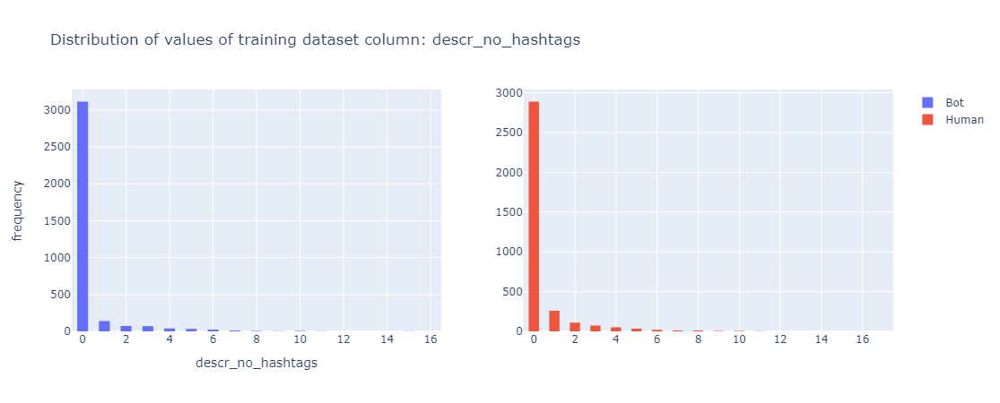

In [468]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_hashtags'],
    # histnorm='density',
    nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_hashtags'],
    # histnorm='density',
    nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_hashtags',
    xaxis_title_text='descr_no_hashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=2),
    xaxis2=dict(showgrid=True, dtick=2),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_hashtags - outliers

In [469]:
df_reduced_outliers_descr_no_hashtags = df_99_percentile(df=train_data, column_name='descr_no_hashtags')

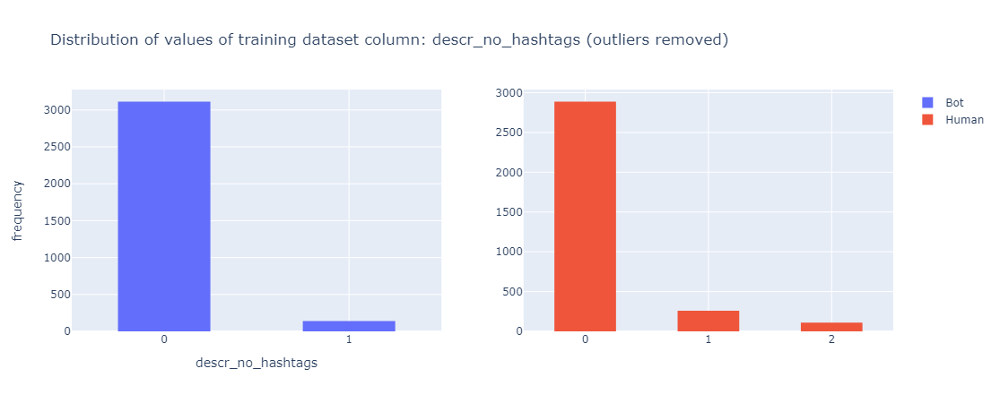

In [470]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_hashtags.loc[df_reduced_outliers_descr_no_hashtags['label']==1,'descr_no_hashtags'],
    # histnorm='density',
    # nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_hashtags.loc[df_reduced_outliers_descr_no_hashtags['label']==0,'descr_no_hashtags'],
    # histnorm='density',
    # nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_hashtags (outliers removed)',
    xaxis_title_text='descr_no_hashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_no_cashtags


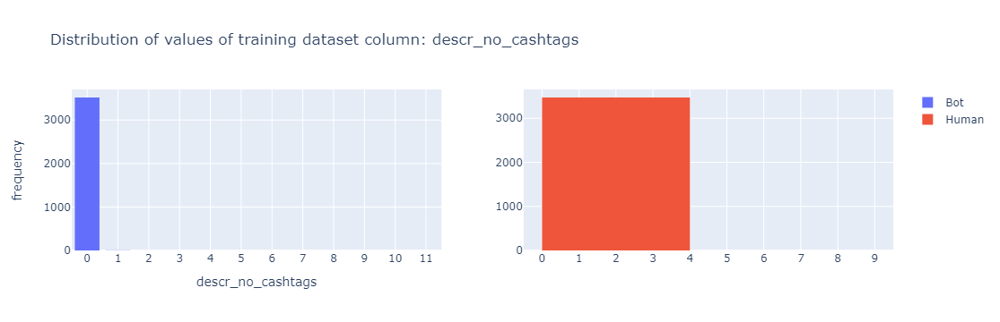

In [471]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_cashtags',
    xaxis_title_text='descr_no_cashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_cashtags - outliers

In [472]:
df_reduced_outliers_descr_no_cashtags = df_99_percentile(df=train_data, column_name='descr_no_cashtags')

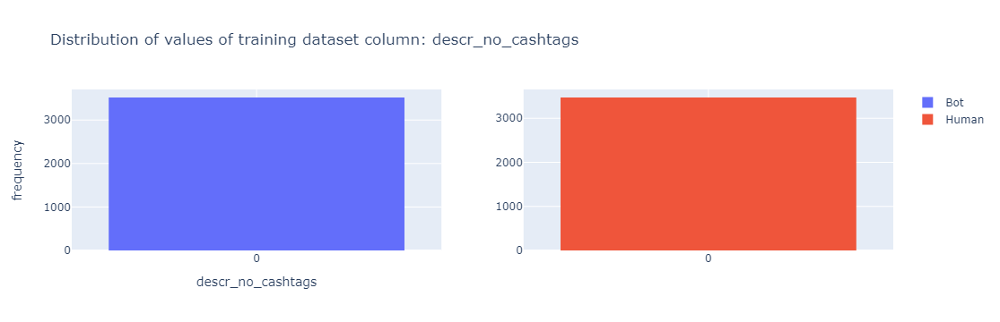

In [473]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_cashtags.loc[df_reduced_outliers_descr_no_cashtags['label']==1,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_cashtags.loc[df_reduced_outliers_descr_no_cashtags['label']==0,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_cashtags',
    xaxis_title_text='descr_no_cashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

Better to drop this column (DONE, droped later)

### descr_no_mentions

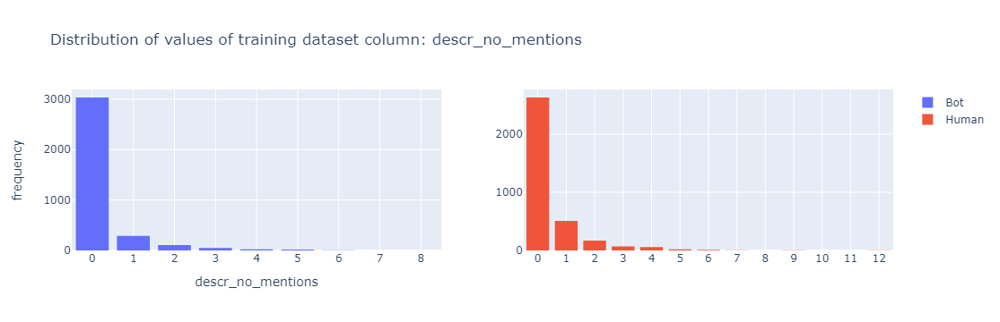

In [474]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_mentions - outliers

In [475]:
df_reduced_outliers_descr_no_mentions = df_99_percentile(df=train_data, column_name='descr_no_mentions')

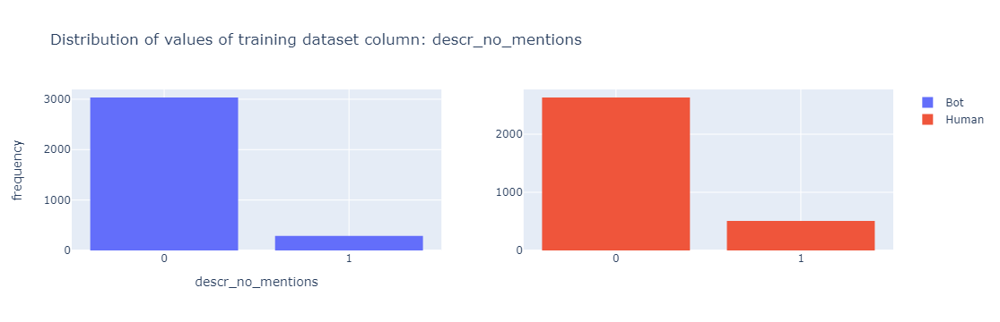

In [476]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_mentions.loc[df_reduced_outliers_descr_no_mentions['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_mentions.loc[df_reduced_outliers_descr_no_mentions['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_no_urls

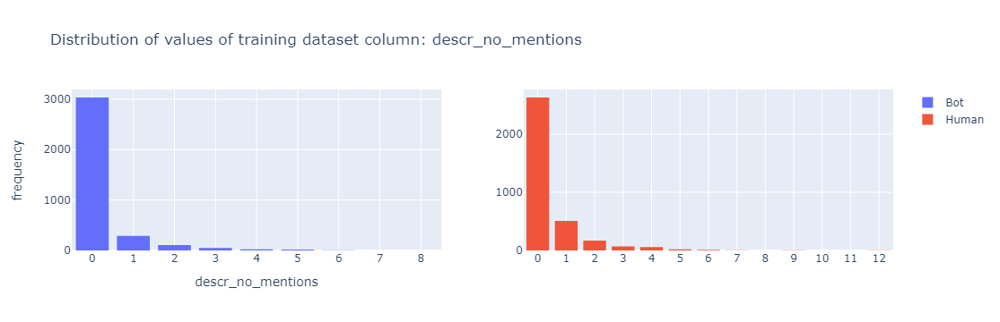

In [477]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_urls - outliers

In [478]:
df_reduced_outliers_descr_no_urls = df_99_percentile(df=train_data, column_name='descr_no_urls')

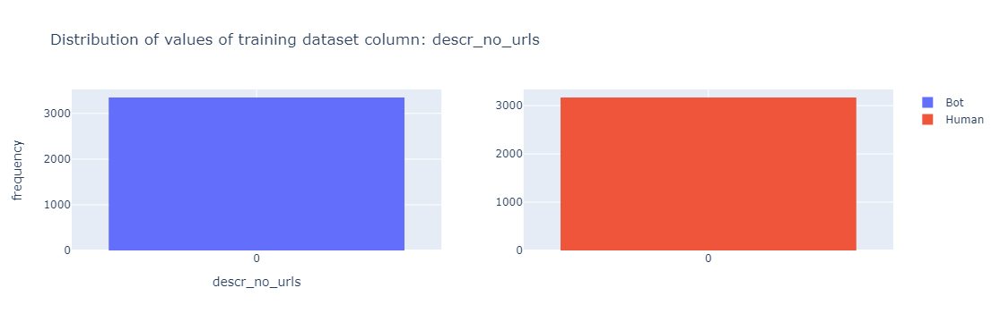

In [479]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_urls.loc[df_reduced_outliers_descr_no_urls['label']==1,'descr_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_urls.loc[df_reduced_outliers_descr_no_urls['label']==0,'descr_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_urls',
    xaxis_title_text='descr_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

Better to drop this column (DONE, droped later)

### url_no_urls

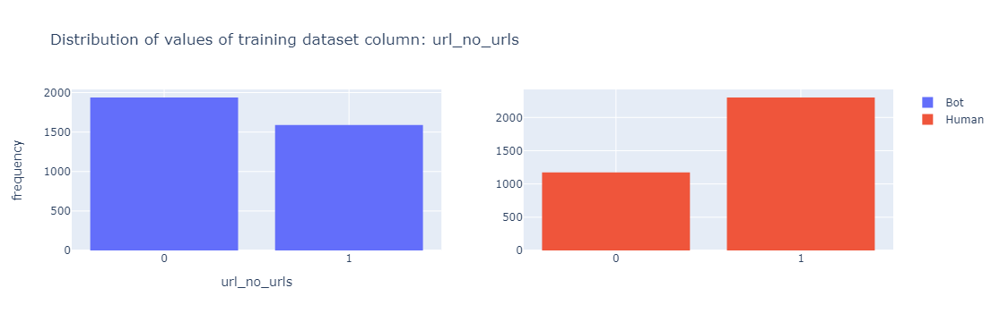

In [480]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: url_no_urls',
    xaxis_title_text='url_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### url_no_urls - outliers

In [481]:
df_reduced_outliers_url_no_urls = df_99_percentile(df=train_data, column_name='url_no_urls')

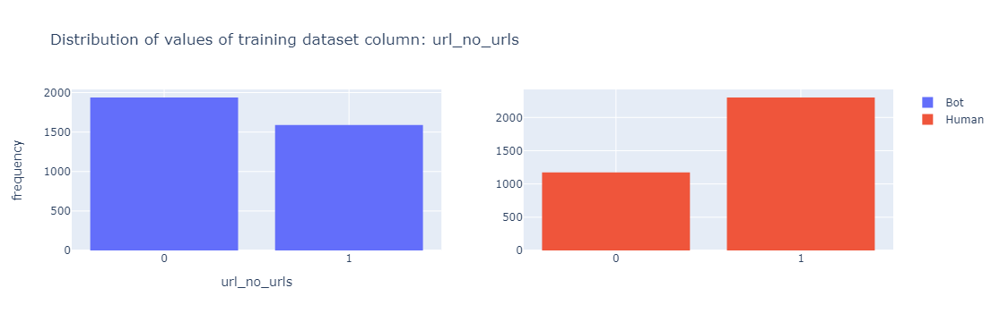

In [482]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_url_no_urls.loc[df_reduced_outliers_url_no_urls['label']==1,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_url_no_urls.loc[df_reduced_outliers_url_no_urls['label']==0,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: url_no_urls',
    xaxis_title_text='url_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_len

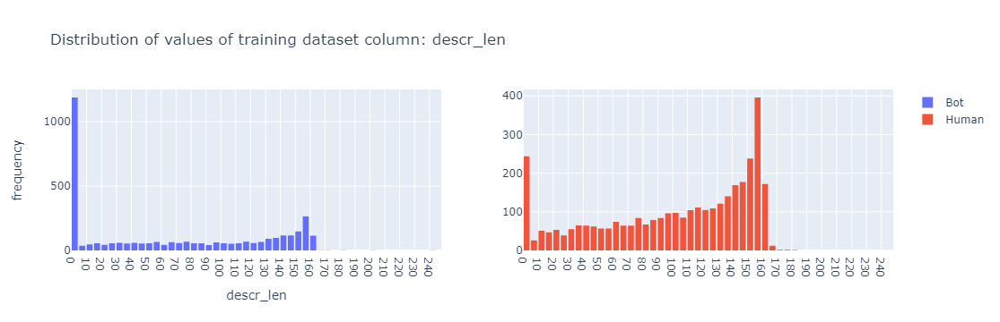

In [483]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_len',
    xaxis_title_text='descr_len', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10, range=[0, max(train_data['descr_len'])+5]),
    xaxis2=dict(showgrid=True, dtick=10, range=[0, max(train_data['descr_len'])+5]),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_len - outliers

In [484]:
q_hi_bots1 = train_data.loc[train_data['label']==1]['descr_len'].quantile(0.99, interpolation='nearest')
q_hi_humans1 = train_data.loc[train_data['label']==0]['descr_len'].quantile(0.99, interpolation='nearest')

df_reduced_outliers_descr_len =  train_data[((train_data['label']==1) & (train_data['descr_len'] < q_hi_bots1)) | ((train_data['label']==0) & (train_data['descr_len'] < q_hi_humans1))]

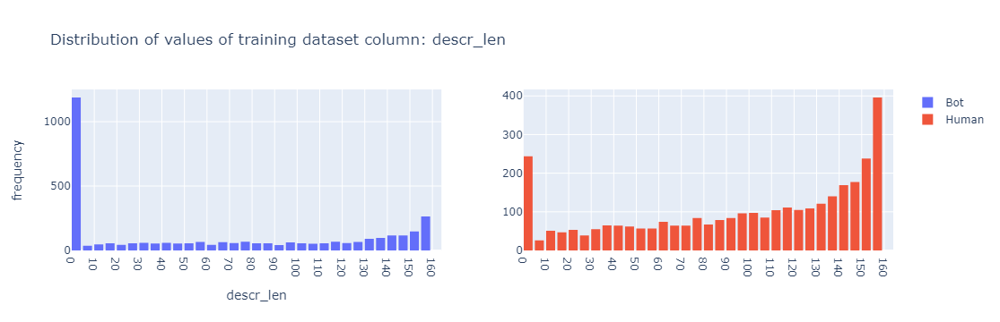

In [485]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==1,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==0,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_len',
    xaxis_title_text='descr_len', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10, range=[0, max(df_reduced_outliers_descr_len['descr_len'])+5]),
    xaxis2=dict(showgrid=True, dtick=10, range=[0, max(df_reduced_outliers_descr_len['descr_len'])+5]),
    yaxis=dict(showgrid=True))

fig.show()

### account_age

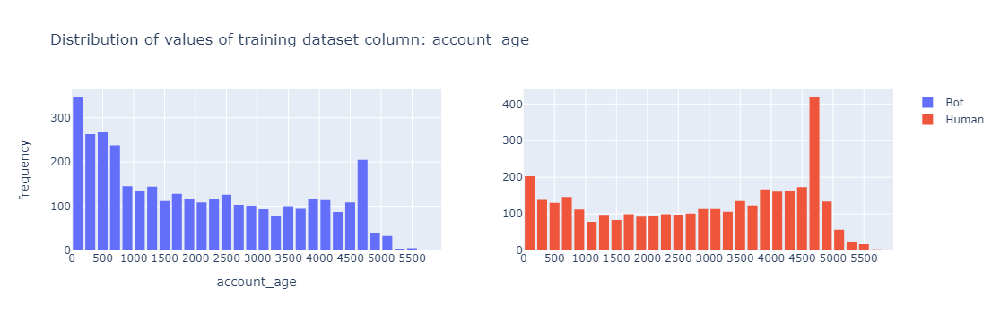

In [486]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: account_age',
    xaxis_title_text='account_age', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=500, range=[0, max(train_data['account_age'])+250]),
    xaxis2=dict(showgrid=True, dtick=500, range=[0, max(train_data['account_age'])+250]),
    yaxis=dict(showgrid=True))

fig.show()

#### account_age - outliers

In [487]:
q_hi_bots2 = train_data.loc[train_data['label']==1]['account_age'].quantile(0.99, interpolation='nearest')
q_hi_humans2 = train_data.loc[train_data['label']==0]['account_age'].quantile(0.99, interpolation='nearest')

df_reduced_outliers_account_age =  train_data[((train_data['label']==1) & (train_data['account_age'] < q_hi_bots2)) | ((train_data['label']==0) & (train_data['account_age'] < q_hi_humans2))]

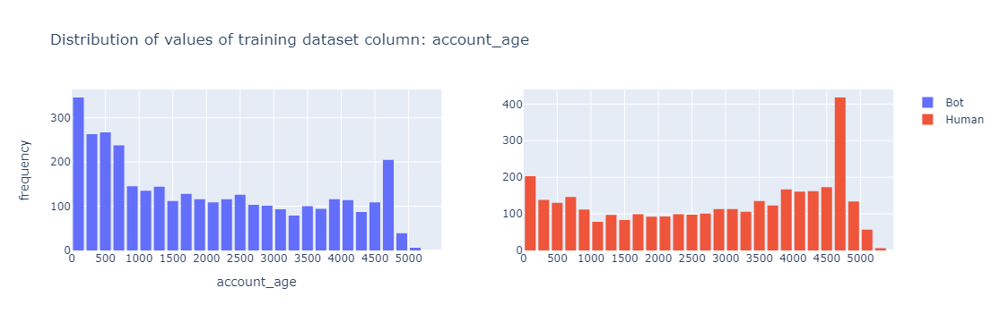

In [488]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_account_age.loc[df_reduced_outliers_account_age['label']==1,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_account_age.loc[df_reduced_outliers_account_age['label']==0,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: account_age',
    xaxis_title_text='account_age', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=500, range=[0, max(df_reduced_outliers_account_age['account_age'])+250]),
    xaxis2=dict(showgrid=True, dtick=500, range=[0, max(df_reduced_outliers_account_age['account_age'])+250]),
    yaxis=dict(showgrid=True))

fig.show()

### country_numeric

In [489]:
def map_contries_to_str(numeric_encoded_country_list):
    mapped_countries = []
    for i,row in enumerate(numeric_encoded_country_list):
        numeric_value = int(row)
        res = dict((v,k) for k,v in country_dict.items())
        mapped_countries.append(res[numeric_value])
    return mapped_countries

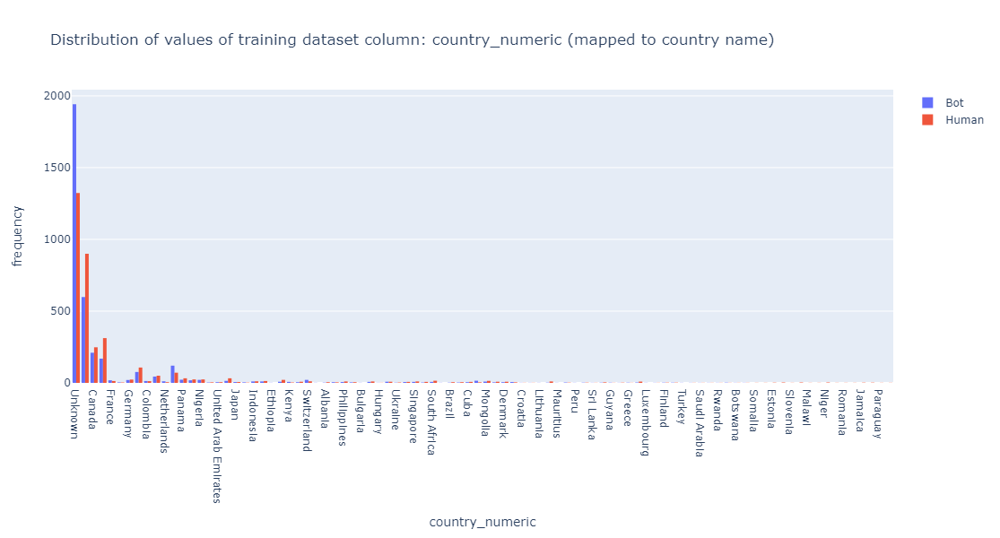

In [490]:
fig = go.Figure()
# fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=map_contries_to_str(train_data.loc[train_data['label']==1,'country_numeric']),
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
# row=1, col=1
)
fig.add_trace(go.Histogram(
    x=map_contries_to_str(train_data.loc[train_data['label']==0,'country_numeric']),
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
# row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: country_numeric (mapped to country name)',
    xaxis_title_text='country_numeric', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1200,
    height=600,
    legend={"title":""},
    # xaxis=dict(showgrid=True, dtick=10),
    # xaxis2=dict(showgrid=True, dtick=10),
    yaxis=dict(showgrid=True))

fig.show()

#### country_numeric - outliers

In [491]:
df_reduced_outliers_country_numeric = df_99_percentile(df=train_data, column_name='country_numeric')

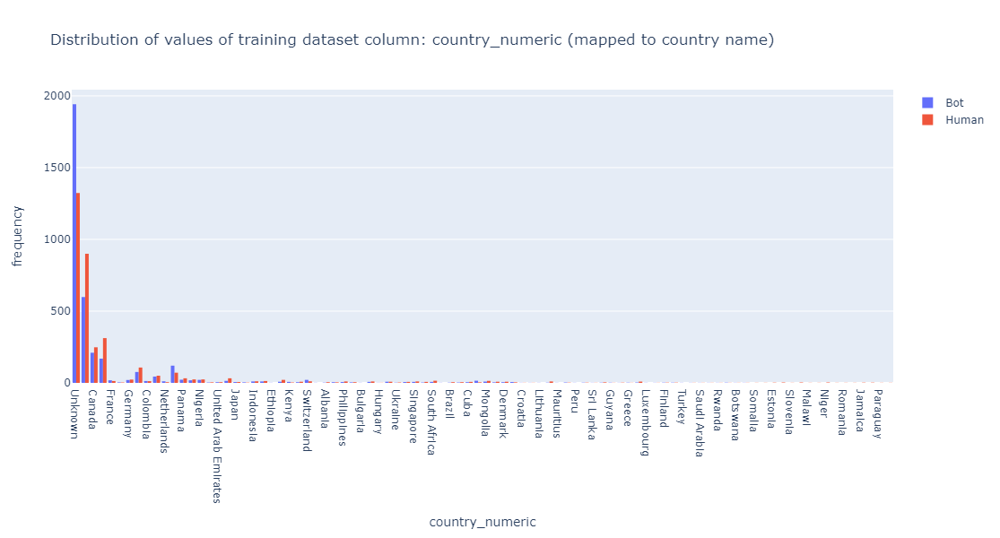

In [492]:
fig = go.Figure()
# fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=map_contries_to_str(df_reduced_outliers_country_numeric.loc[df_reduced_outliers_country_numeric['label']==1,'country_numeric']),
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
# row=1, col=1
)
fig.add_trace(go.Histogram(
    x=map_contries_to_str(df_reduced_outliers_country_numeric.loc[df_reduced_outliers_country_numeric['label']==0,'country_numeric']),
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
# row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: country_numeric (mapped to country name)',
    xaxis_title_text='country_numeric', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1200,
    height=600,
    legend={"title":""},
    # xaxis=dict(showgrid=True, dtick=10),
    # xaxis2=dict(showgrid=True, dtick=10),
    yaxis=dict(showgrid=True))

fig.show()

### Create merged dataframe from reduced by columns outliers dataframes

In [493]:
# train_data_wo_outliers = df_reduced_outliers_followers_count.merge(df_reduced_outliers_following_count, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_tweet_count, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_listed_count, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_descr_no_hashtags, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# # train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_descr_no_cashtags, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_descr_no_mentions, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_descr_no_urls, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_url_no_urls, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_descr_len, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')
# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_account_age, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

# train_data_wo_outliers = train_data_wo_outliers.merge(df_reduced_outliers_country_numeric, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

In [494]:
train_data_wo_outliers = df_reduced_outliers_followers_count.merge(df_reduced_outliers_following_count, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

rest_of_df = [df_reduced_outliers_tweet_count, 
              df_reduced_outliers_listed_count, 
              df_reduced_outliers_descr_no_hashtags, 
              df_reduced_outliers_descr_no_cashtags,
              df_reduced_outliers_descr_no_mentions,
              df_reduced_outliers_descr_no_urls,
              df_reduced_outliers_url_no_urls,
              df_reduced_outliers_descr_len,
              df_reduced_outliers_account_age,
              df_reduced_outliers_country_numeric]

for df in rest_of_df:
    if (len(df.loc[df['label']==1]) > 0 and len(df.loc[df['label']==0]) > 0):
        train_data_wo_outliers = train_data_wo_outliers.merge(df, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

In [495]:
len(train_data_wo_outliers)

4893

In [496]:
train_data_wo_outliers

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
0,1.099278e+08,0.0,0.0,0.0,1.0,1.0,1.0,2764.0,1497.0,5129.0,96.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,151.0,4428.0
1,1.362188e+18,1.0,0.0,0.0,0.0,1.0,0.0,0.0,54.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,392.0
2,4.814260e+08,1.0,0.0,0.0,1.0,1.0,0.0,89.0,200.0,1.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,236.0,129.0,3695.0
3,5.773607e+08,0.0,0.0,0.0,1.0,1.0,0.0,3999.0,3454.0,811.0,74.0,1.0,0.0,0.0,0.0,0.0,1.0,41.0,82.0,3596.0
4,1.235906e+18,0.0,0.0,0.0,0.0,1.0,0.0,37.0,73.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,740.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4888,3.053537e+09,0.0,0.0,0.0,1.0,1.0,0.0,12.0,94.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,236.0,48.0,2572.0
4889,5.724116e+08,1.0,0.0,0.0,0.0,1.0,0.0,52.0,481.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3601.0
4890,4.348814e+09,0.0,0.0,0.0,0.0,1.0,0.0,37.0,304.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2296.0
4891,1.412609e+18,1.0,0.0,0.0,0.0,1.0,0.0,19.0,134.0,693.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,29.0,252.0


#### Drop 'id' column

In [497]:
train_data = train_data.drop(['id'], axis=1)
val_data = val_data.drop(['id'], axis=1)
test_data = test_data.drop(['id'], axis=1)

train_data_wo_outliers = train_data_wo_outliers.drop(['id'], axis=1)
val_data_wo_outliers = val_data_wo_outliers.drop(['id'], axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(['id'], axis=1)

### Filter to have the same number of records for each class - part II

In [498]:
train_data = filter_df_for_balanced_classes(train_data, bot_label_value=1, human_label_value=0)
val_data = filter_df_for_balanced_classes(val_data, bot_label_value=1, human_label_value=0)
test_data = filter_df_for_balanced_classes(test_data, bot_label_value=1, human_label_value=0)

Number of bots:  3473
Number of human users:  3473
Number of bots:  743
Number of human users:  743
Number of bots:  730
Number of human users:  730


In [499]:
train_data_wo_outliers = filter_df_for_balanced_classes(train_data_wo_outliers, bot_label_value=1, human_label_value=0)
val_data_wo_outliers = filter_df_for_balanced_classes(val_data_wo_outliers, bot_label_value=1, human_label_value=0)
test_data_wo_outliers = filter_df_for_balanced_classes(test_data_wo_outliers, bot_label_value=1, human_label_value=0)

Number of bots:  2302
Number of human users:  2302
Number of bots:  743
Number of human users:  743
Number of bots:  730
Number of human users:  730


### Normalize data by column range of training set

In [500]:
# train_dataframe = pd.DataFrame(train_data).copy()
# val_dataframe = pd.DataFrame(val_data).copy()
# test_dataframe = pd.DataFrame(test_data).copy()

# train_dataframe_wo_outliers = pd.DataFrame(train_data_wo_outliers).copy()
# val_dataframe_wo_outliers = pd.DataFrame(val_data_wo_outliers).copy()
# test_dataframe_wo_outliers = pd.DataFrame(test_data_wo_outliers).copy()

In [501]:
columns_to_normalize = ['followers_count', 'following_count', 'tweet_count', 'listed_count', 'descr_len', 'account_age']

In [502]:
min_max_scaler = MinMaxScaler()
min_max_scaler.fit(train_data[columns_to_normalize])

train_data[columns_to_normalize] = min_max_scaler.transform(train_data[columns_to_normalize])
val_data[columns_to_normalize]   = min_max_scaler.transform(val_data[columns_to_normalize])
test_data[columns_to_normalize]  = min_max_scaler.transform(test_data[columns_to_normalize])

In [503]:
min_max_scaler_outliers = MinMaxScaler()
min_max_scaler_outliers.fit(train_data_wo_outliers[columns_to_normalize])

train_data_wo_outliers[columns_to_normalize] = min_max_scaler_outliers.transform(train_data_wo_outliers[columns_to_normalize])
val_data_wo_outliers[columns_to_normalize]   = min_max_scaler_outliers.transform(val_data_wo_outliers[columns_to_normalize])
test_data_wo_outliers[columns_to_normalize]  = min_max_scaler_outliers.transform(test_data_wo_outliers[columns_to_normalize])

#### Column country_numeric normalize based on all possible values - dictionary country_dict

In [504]:
def custom_min_max_norm(df, col_name, min_val, max_val):
    df[col_name] = ((df[col_name] - min_val) / (max_val - min_val))
    return df

In [505]:
min(train_data['country_numeric'])

1.0

In [506]:
max(train_data['country_numeric'])

250.0

In [507]:
country_numeric_col = 'country_numeric'
min_val = min(country_dict.values())
max_val = max(country_dict.values())

train_data = custom_min_max_norm(train_data, country_numeric_col, min_val, max_val)
val_data = custom_min_max_norm(val_data, country_numeric_col, min_val, max_val)
test_data = custom_min_max_norm(test_data, country_numeric_col, min_val, max_val)

train_data_wo_outliers = custom_min_max_norm(train_data_wo_outliers, country_numeric_col, min_val, max_val)
val_data_wo_outliers = custom_min_max_norm(val_data_wo_outliers, country_numeric_col, min_val, max_val)
test_data_wo_outliers = custom_min_max_norm(test_data_wo_outliers, country_numeric_col, min_val, max_val)

In [508]:
train_data

,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,country_numeric,descr_len,account_age
6625,0.0,0.0,0.0,1.0,1.0,0.0,0.000320,0.002301,1.570096e-04,0.000417,1.0,0.0,0.0,4.0,0.0,1.0,0.164,0.604938,0.136443
2489,0.0,0.0,0.0,1.0,1.0,1.0,0.001597,0.006130,4.329582e-03,0.006673,1.0,0.0,0.0,1.0,0.0,1.0,0.004,0.621399,0.772711
9919,0.0,0.0,0.0,1.0,1.0,1.0,0.001224,0.020480,2.175343e-03,0.000139,1.0,0.0,0.0,5.0,0.0,1.0,0.660,0.658436,0.515433
6964,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000221,8.441376e-07,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.004,0.000000,0.064890
3467,0.0,0.0,0.0,1.0,1.0,0.0,0.000177,0.000667,3.894007e-03,0.000626,1.0,2.0,0.0,0.0,1.0,1.0,0.944,0.592593,0.188881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3325,0.0,0.0,0.0,1.0,1.0,0.0,0.000305,0.006495,1.915348e-03,0.004935,1.0,0.0,0.0,0.0,0.0,0.0,0.004,0.658436,0.585058
1881,0.0,0.0,0.0,1.0,1.0,1.0,0.000627,0.016188,4.270492e-03,0.001321,1.0,1.0,0.0,2.0,0.0,1.0,0.004,0.609053,0.712732
4861,0.0,0.0,0.0,1.0,1.0,0.0,0.000007,0.000385,3.376550e-06,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.944,0.197531,0.447212
1175,0.0,0.0,0.0,0.0,1.0,0.0,0.000021,0.001245,2.532413e-05,0.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.004,0.000000,0.398807


In [509]:
min(train_data['country_numeric'])

0.004

In [510]:
max(train_data['country_numeric'])

1.0

## Correlation

#### First drop columns in dataframes where there are same value in whole columns in trin dataset

In [511]:
same_data_columns = list(train_data.columns[train_data.apply(lambda x: x.nunique()) == 1])
same_data_columns

['has_profile_image_url']

In [512]:
train_data = train_data.drop(same_data_columns, axis=1)

val_data = val_data.drop(same_data_columns, axis=1)
test_data = test_data.drop(same_data_columns, axis=1)

In [513]:
sns.set(font_scale=2)

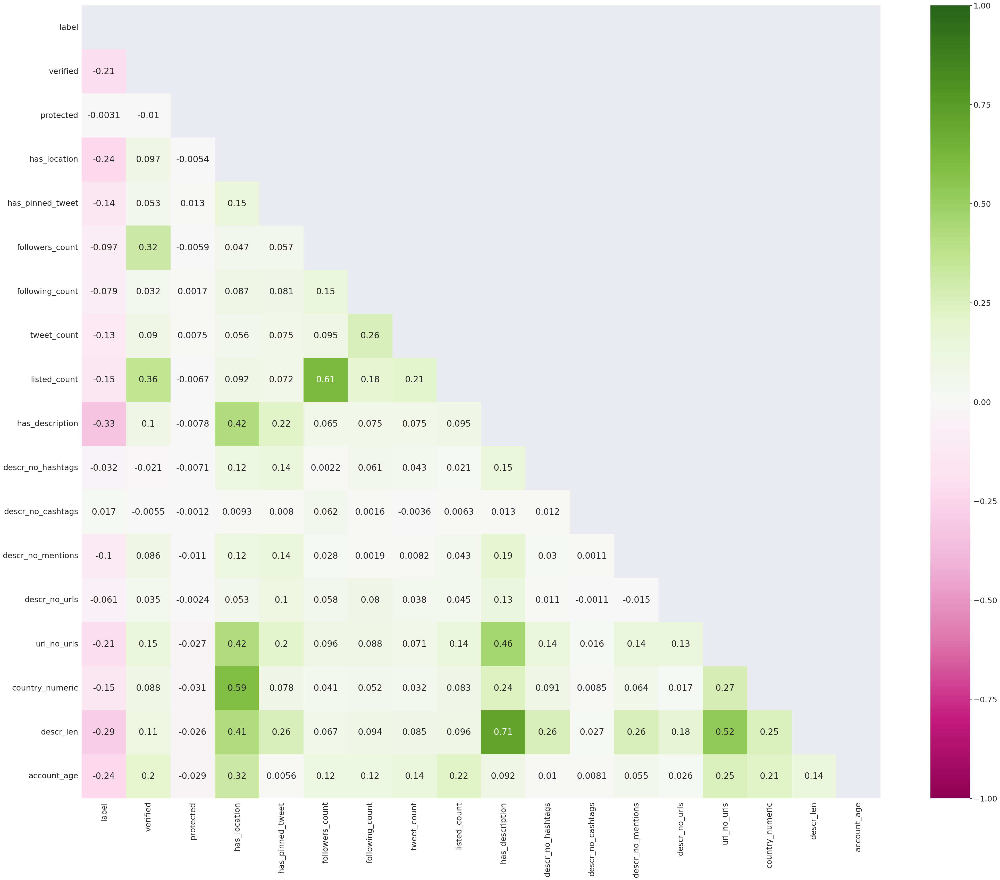

In [514]:
corr_threshold = 0.52
corr = train_data.corr()
lower_tri = corr.where(np.tril(np.ones(corr.shape),k=-1).astype(bool)) #creating lower triangular correlation matrix
f = plt.figure(figsize=(50, 40))
sns.heatmap(lower_tri, cmap="PiYG", annot=True, vmin=-1, vmax=1, ax=plt.gca()) #, annot_kws={"fontsize": 16})
high_corr = []
for column in train_data:
   for col in train_data:
     if abs(lower_tri[column][col]) > corr_threshold:
         high_corr.append((column, col, lower_tri[column][col]))
high_corr = sorted(high_corr, key=lambda x: x[2], reverse=True)

In [515]:
sns.set(font_scale=1)

In [516]:
print("Number of columns containing high correlation:", len(set([x[0] for x in high_corr])))
high_corr

Number of columns containing high correlation: 4


[('has_description', 'descr_len', 0.7110425815905413),
 ('followers_count', 'listed_count', 0.6114531107968122),
 ('has_location', 'country_numeric', 0.5902739368145336),
 ('url_no_urls', 'descr_len', 0.5241034123130848)]

In [517]:
train_data = train_data.drop(['listed_count'], axis=1)
val_data = val_data.drop(['listed_count'], axis=1)
test_data = test_data.drop(['listed_count'], axis=1)

train_data = train_data.drop(['url_no_urls'], axis=1)
val_data = val_data.drop(['url_no_urls'], axis=1)
test_data = test_data.drop(['url_no_urls'], axis=1)

train_data = train_data.drop(['has_description'], axis=1)
val_data = val_data.drop(['has_description'], axis=1)
test_data = test_data.drop(['has_description'], axis=1)

train_data = train_data.drop(['has_location'], axis=1)
val_data = val_data.drop(['has_location'], axis=1)
test_data = test_data.drop(['has_location'], axis=1)

### Correlation of data reduced by outliers

#### First drop columns in filter (without outliers) dataframe where now have same value in whole column

In [518]:
same_data_columns = list(train_data_wo_outliers.columns[train_data_wo_outliers.apply(lambda x: x.nunique()) == 1])
same_data_columns

['has_profile_image_url', 'descr_no_cashtags', 'descr_no_urls']

In [519]:
train_data_wo_outliers = train_data_wo_outliers.drop(same_data_columns, axis=1)

val_data_wo_outliers = val_data_wo_outliers.drop(same_data_columns, axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(same_data_columns, axis=1)

#### Correlation

In [520]:
sns.set(font_scale=2)

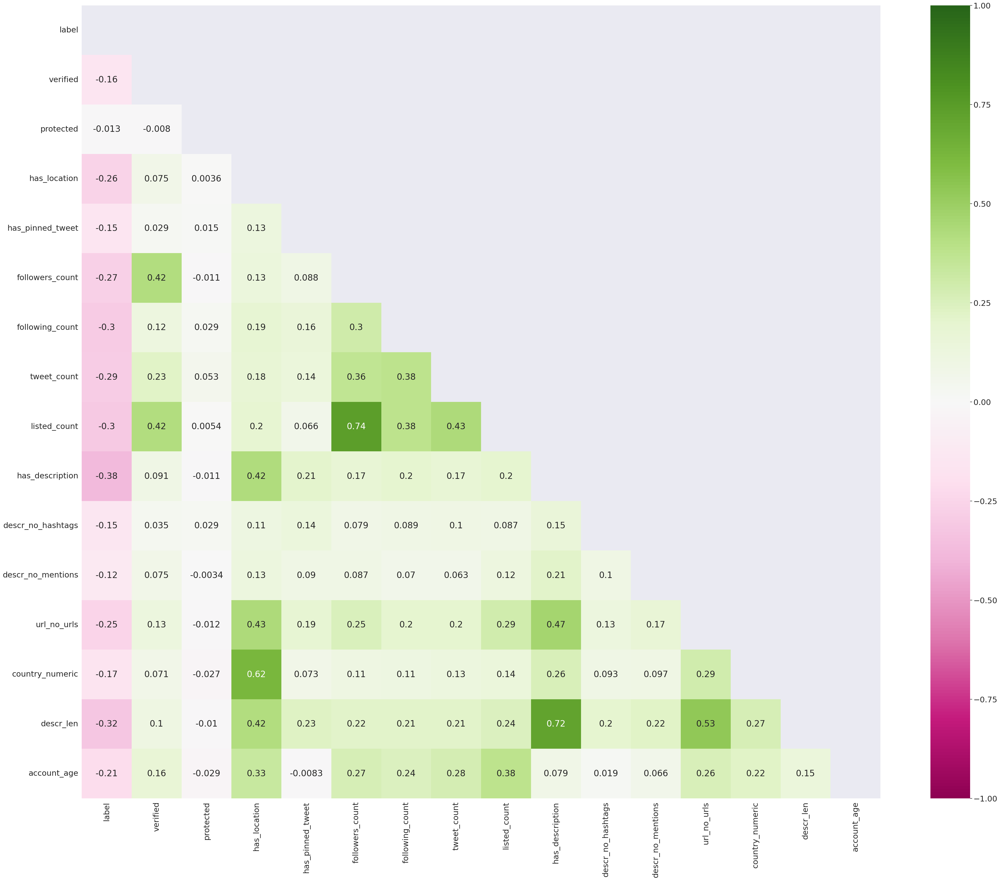

In [521]:
corr_threshold2 = 0.52
corr2 = train_data_wo_outliers.corr()
lower_tri2 = corr2.where(np.tril(np.ones(corr2.shape),k=-1).astype(bool)) #creating lower triangular correlation matrix
f = plt.figure(figsize=(50, 40))
sns.heatmap(lower_tri2, cmap="PiYG", annot=True, vmin=-1, vmax=1, ax=plt.gca()) #, annot_kws={"fontsize": 16})
high_corr2 = []
for column in train_data_wo_outliers:
   for col in train_data_wo_outliers:
     if abs(lower_tri2[column][col]) > corr_threshold2:
         high_corr2.append((column, col, lower_tri2[column][col]))
high_corr2 = sorted(high_corr2, key=lambda x: x[2], reverse=True)

#### Drop column with higher correlation

In [522]:
f = plt.figure(figsize=(50, 40))
sns.set(font_scale=1)

<Figure size 5000x4000 with 0 Axes>

In [523]:
high_corr2

[('followers_count', 'listed_count', 0.73558148149462),
 ('has_description', 'descr_len', 0.7173117520970937),
 ('has_location', 'country_numeric', 0.6202253392278838),
 ('url_no_urls', 'descr_len', 0.534075574289665)]

In [524]:
train_data_wo_outliers = train_data_wo_outliers.drop(['listed_count', 'has_description', 'has_location', 'url_no_urls'], axis=1)
val_data_wo_outliers = val_data_wo_outliers.drop(['listed_count', 'has_description', 'has_location', 'url_no_urls'], axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(['listed_count', 'has_description', 'has_location', 'url_no_urls'], axis=1)

#### Split data for input and output

In [525]:
train_X = train_data.drop(['label'], axis=1)
train_Y = pd.concat([train_data['label']], axis=1)
val_X = val_data.drop(['label'], axis=1)
val_Y = pd.concat([val_data['label']], axis=1)
test_X = test_data.drop(['label'], axis=1)
test_Y = pd.concat([test_data['label']], axis=1)


train_data_wo_outliers_X = train_data_wo_outliers.drop(['label'], axis=1)
train_data_wo_outliers_Y = pd.concat([train_data_wo_outliers['label']], axis=1)
val_data_wo_outliers_X = val_data_wo_outliers.drop(['label'], axis=1)
val_data_wo_outliers_Y = pd.concat([val_data_wo_outliers['label']], axis=1)
test_data_wo_outliers_X = test_data_wo_outliers.drop(['label'], axis=1)
test_data_wo_outliers_Y = pd.concat([test_data_wo_outliers['label']], axis=1)

# DNN models

#### Function to load a saved neural network model

In [526]:
from keras.models import load_model

def load_model_from_file(filepath):
  model = load_model(filepath)
  return model

#### Summary of metrics based on real and predicted data by the network

In [527]:
def get_model_metrics(test_Y, out_Y):
  accuracy = accuracy_score(test_Y, out_Y)
  print('Accuracy: {}'.format(accuracy))
  # precision tp / (tp + fp)
  precision = precision_score(test_Y, out_Y, average=None)
  print('Precision: {}'.format(precision))
  # recall: tp / (tp + fn)
  recall = recall_score(test_Y, out_Y)
  print('Recall: {}'.format(recall))
  # f1: 2 tp / (2 tp + fp + fn)
  f1 = f1_score(test_Y, out_Y)
  print('F1 score: %f' % f1)
  # ROC AUC
  auc = roc_auc_score(test_Y, out_Y)
  print('ROC AUC: %f' % auc)
  return (accuracy, precision, recall, f1, auc)

#### Creating a confusion matrix

In [528]:
def create_confusion_matrix(test_Y, out_Y):
    cm = sklearn.metrics.confusion_matrix(test_Y, out_Y)

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n\n{v2}" for v1, v2 in zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    plt.figure()
    fig = plt.figure(figsize=(4,4))
    ax = fig.add_subplot(111)

    sns.heatmap(
        cm,
        annot=labels,
        annot_kws={"size": 12},
        fmt='',
        cmap=plt.cm.Blues,
        cbar=False
    )
    ax.set_title("Confusion matrix", fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
    ax.set_ylabel('True', fontsize=12)
    ax.set_xlabel('Predicted', fontsize=12)
    
    fig.show()

## Neural network models 

In [529]:
# EarlyStopping
def early_stop(metric='val_accuracy', mode = 'max', patience=50):
    return EarlyStopping(monitor='val_accuracy',
                           patience=patience,
                           restore_best_weights=True,
                           mode=mode)
# PlotLosses
def plot_losses():
    return PlotLossesCallback()

# ModelCheckpoint
def checkpoint_callback(model_name):
    return ModelCheckpoint(filepath = models_path + '/' + model_name + '.hdf5',
                            monitor = "val_accuracy",
                            save_best_only = True,
                            # save_weights_only = True,
                            verbose=1)

In [530]:
def train_model(model, model_name, train_X, train_Y, val_X, val_Y, batch_size, epochs):
    model.fit(train_X, train_Y, batch_size=batch_size, epochs=epochs,
                validation_data=(val_X, val_Y),
                callbacks=[plot_losses(),
                           early_stop(),
                           checkpoint_callback(model_name)])
    return model

## Model 1.

#### Create model

In [531]:
def create_model_1(shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001)):
  model = Sequential()
  model.add(Input(shape=shape)),
  model.add(Dense(32, activation='sigmoid'))
  model.add(Dense(32, activation='relu'))
  model.add(Dropout(0.2))
  model.add(Dense(64, activation='relu'))
  model.add(Dense(64, activation='sigmoid'))
  model.add(Dropout(0.3))
  model.add(Dense(1, activation='sigmoid'))
  model.compile(optimizer=optimizer, loss=keras.losses.BinaryCrossentropy(), metrics=['accuracy'])
  return model

### batch_size=10, epochs=300

#### Create and train model

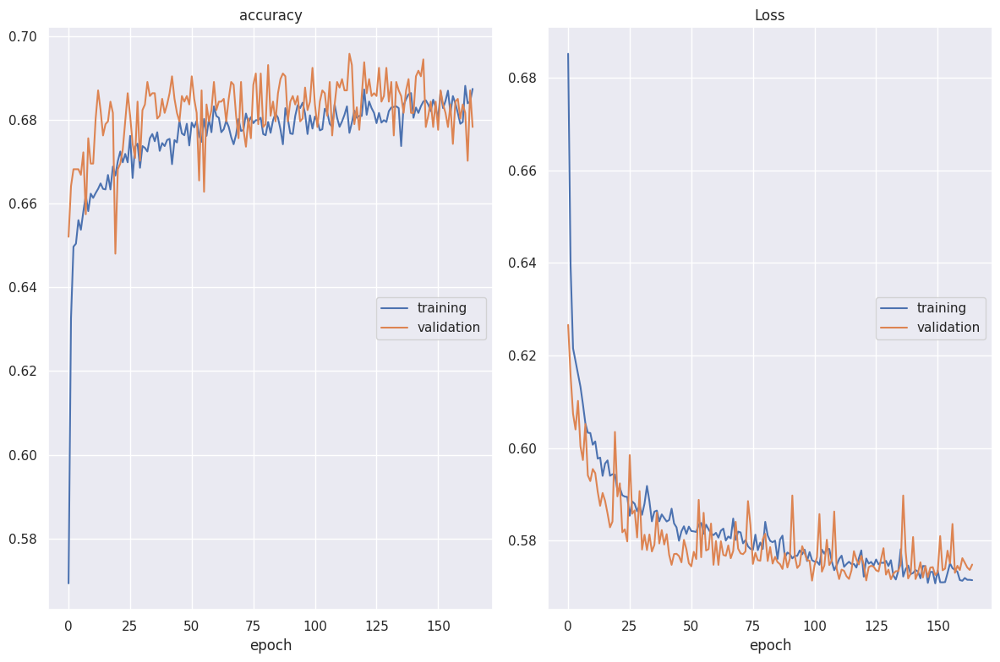

accuracy
	training         	 (min:    0.569, max:    0.688, cur:    0.687)
	validation       	 (min:    0.648, max:    0.696, cur:    0.678)
Loss
	training         	 (min:    0.571, max:    0.685, cur:    0.571)
	validation       	 (min:    0.571, max:    0.627, cur:    0.575)

Epoch 165: val_accuracy did not improve from 0.69583
695/695 [==============================] - 2s 3ms/step - loss: 0.5714 - accuracy: 0.6874 - val_loss: 0.5748 - val_accuracy: 0.6783


In [532]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_10_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=10, epochs=300)

#### Prediction and results

Accuracy: 0.6815068493150684
Precision: [0.68027211 0.68275862]
Recall: 0.678082191780822
F1 score: 0.680412
ROC AUC: 0.681507


(0.6815068493150684,
 array([0.68027211, 0.68275862]),
 0.678082191780822,
 0.6804123711340206,
 0.6815068493150686)

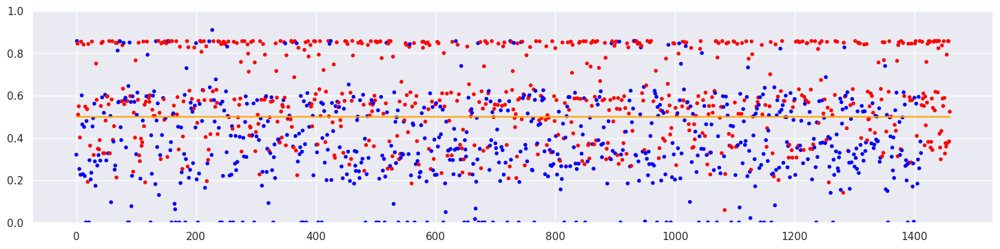

<Figure size 640x480 with 0 Axes>

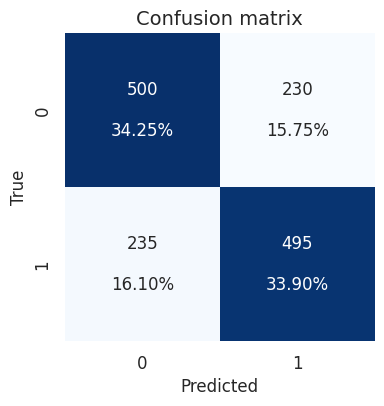

In [533]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=50, epochs=300

In [534]:
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
print(model1_v1.summary())

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_65 (Dense)            (None, 32)                448       
                                                                 
 dense_66 (Dense)            (None, 32)                1056      
                                                                 
 dropout_26 (Dropout)        (None, 32)                0         
                                                                 
 dense_67 (Dense)            (None, 64)                2112      
                                                                 
 dense_68 (Dense)            (None, 64)                4160      
                                                                 
 dropout_27 (Dropout)        (None, 64)                0         
                                                                 
 dense_69 (Dense)            (None, 1)               

### Train model

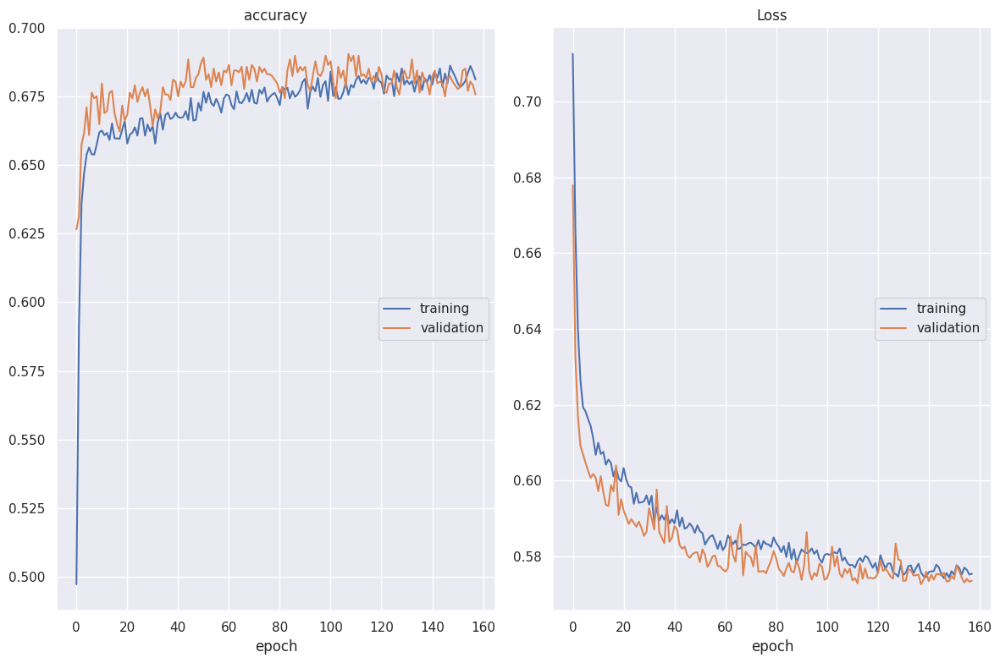

accuracy
	training         	 (min:    0.497, max:    0.686, cur:    0.681)
	validation       	 (min:    0.627, max:    0.690, cur:    0.676)
Loss
	training         	 (min:    0.574, max:    0.713, cur:    0.575)
	validation       	 (min:    0.573, max:    0.678, cur:    0.574)

Epoch 158: val_accuracy did not improve from 0.69044
139/139 [==============================] - 1s 7ms/step - loss: 0.5754 - accuracy: 0.6811 - val_loss: 0.5735 - val_accuracy: 0.6756


In [535]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_50_norm'
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=50, epochs=300)

In [536]:
# Load model
# model = load_model_from_file(models_path + '/model_name.hdf5')

#### Prediction

In [537]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

#### Results

(0.0, 1.0)

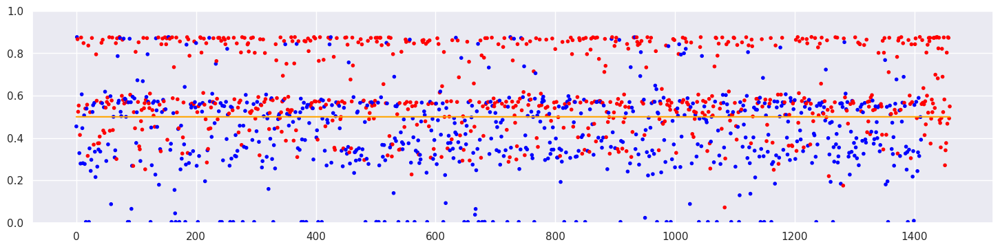

In [538]:
x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

#### Confusion matrix

Accuracy: 0.6746575342465754
Precision: [0.70935961 0.64982374]
Recall: 0.7575342465753425
F1 score: 0.699557
ROC AUC: 0.674658


(0.6746575342465754,
 array([0.70935961, 0.64982374]),
 0.7575342465753425,
 0.6995572422517393,
 0.6746575342465753)

<Figure size 640x480 with 0 Axes>

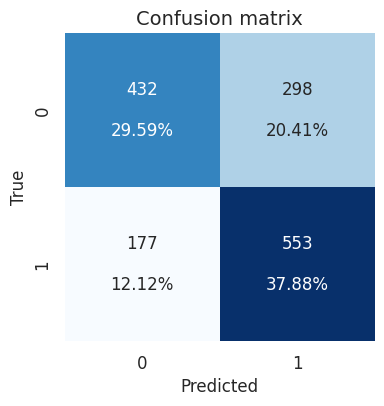

In [539]:
create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=100, epochs=300

#### Create and train model

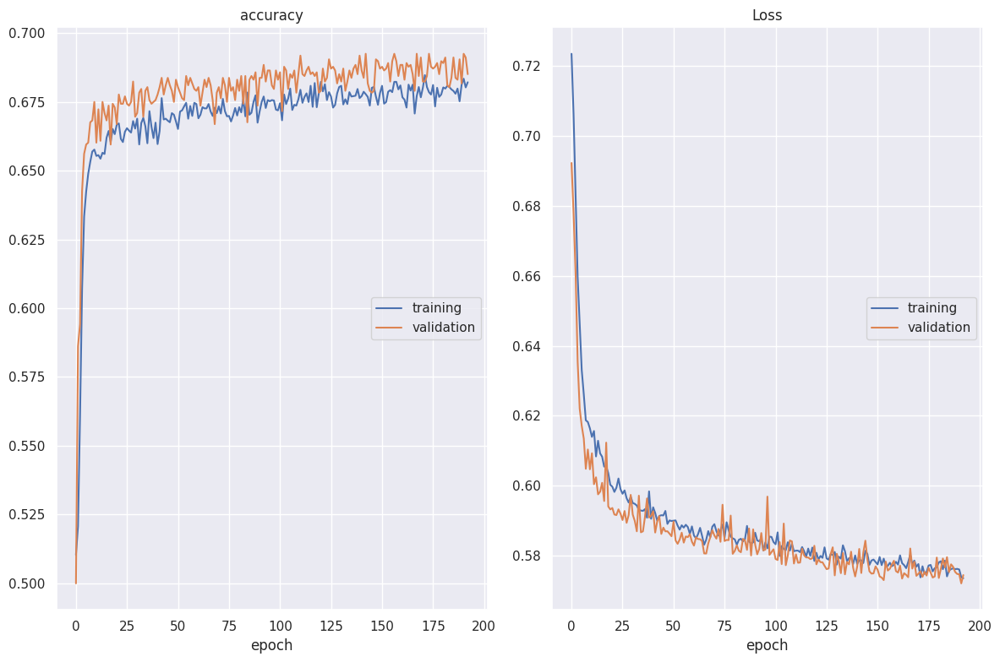

accuracy
	training         	 (min:    0.510, max:    0.685, cur:    0.682)
	validation       	 (min:    0.500, max:    0.692, cur:    0.685)
Loss
	training         	 (min:    0.574, max:    0.724, cur:    0.574)
	validation       	 (min:    0.572, max:    0.692, cur:    0.574)

Epoch 193: val_accuracy did not improve from 0.69246
70/70 [==============================] - 1s 12ms/step - loss: 0.5736 - accuracy: 0.6821 - val_loss: 0.5745 - val_accuracy: 0.6851


In [540]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_100_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=100, epochs=300)

#### Prediction and results

Accuracy: 0.6821917808219178
Precision: [0.68319559 0.68119891]
Recall: 0.684931506849315
F1 score: 0.683060
ROC AUC: 0.682192


(0.6821917808219178,
 array([0.68319559, 0.68119891]),
 0.684931506849315,
 0.6830601092896174,
 0.6821917808219179)

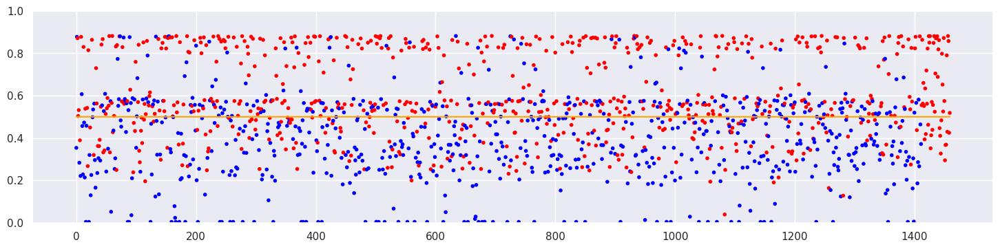

<Figure size 640x480 with 0 Axes>

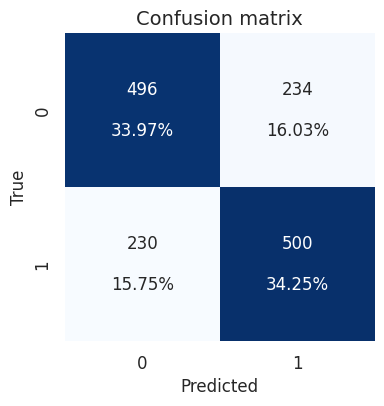

In [541]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=150, epochs=300

#### Create and train model

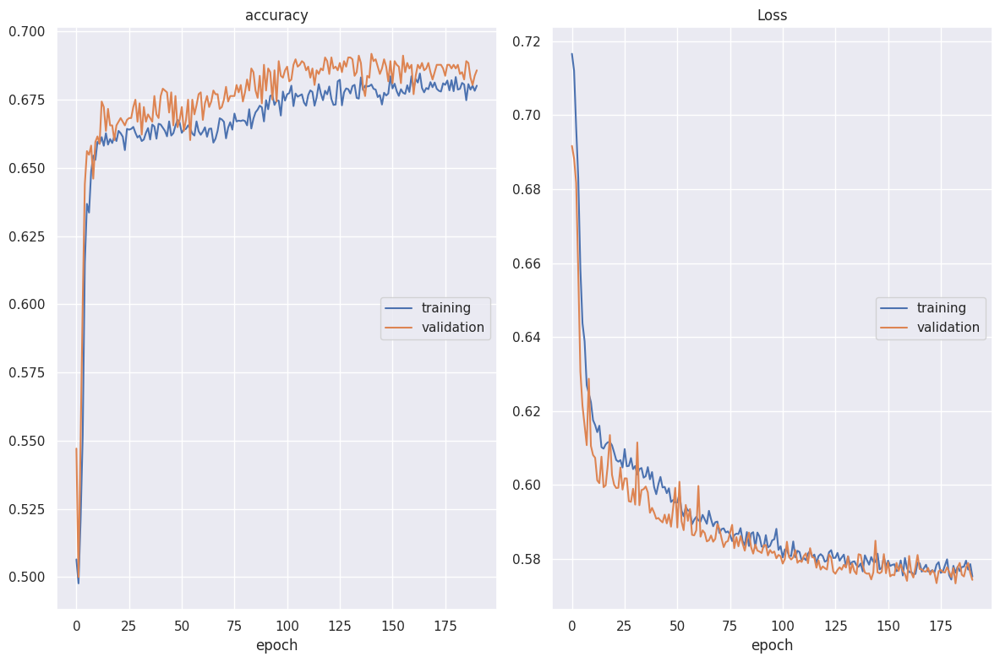

accuracy
	training         	 (min:    0.498, max:    0.685, cur:    0.680)
	validation       	 (min:    0.500, max:    0.692, cur:    0.686)
Loss
	training         	 (min:    0.574, max:    0.717, cur:    0.575)
	validation       	 (min:    0.573, max:    0.692, cur:    0.574)

Epoch 191: val_accuracy did not improve from 0.69179
47/47 [==============================] - 1s 24ms/step - loss: 0.5752 - accuracy: 0.6801 - val_loss: 0.5743 - val_accuracy: 0.6857


In [542]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_150_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=150, epochs=300)

#### Prediction and results

Accuracy: 0.6773972602739726
Precision: [0.69128508 0.66538953]
Recall: 0.7136986301369863
F1 score: 0.688698
ROC AUC: 0.677397


(0.6773972602739726,
 array([0.69128508, 0.66538953]),
 0.7136986301369863,
 0.6886979510905487,
 0.6773972602739726)

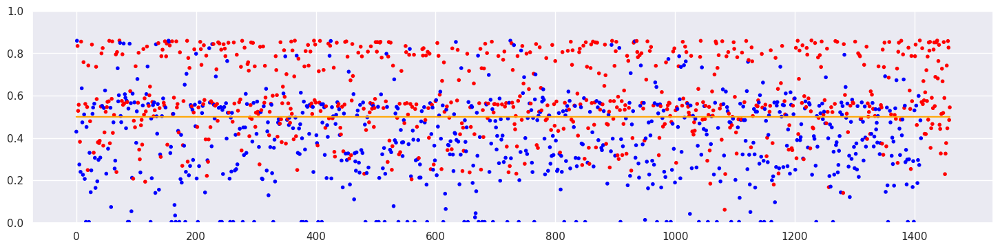

<Figure size 640x480 with 0 Axes>

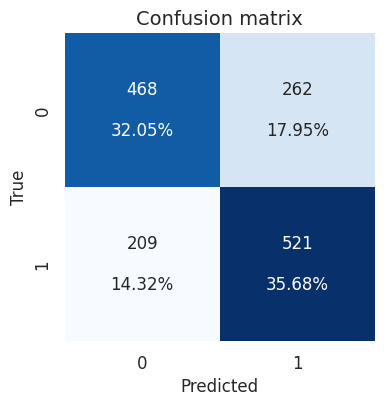

In [543]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=200, epochs=300

#### Create and train model

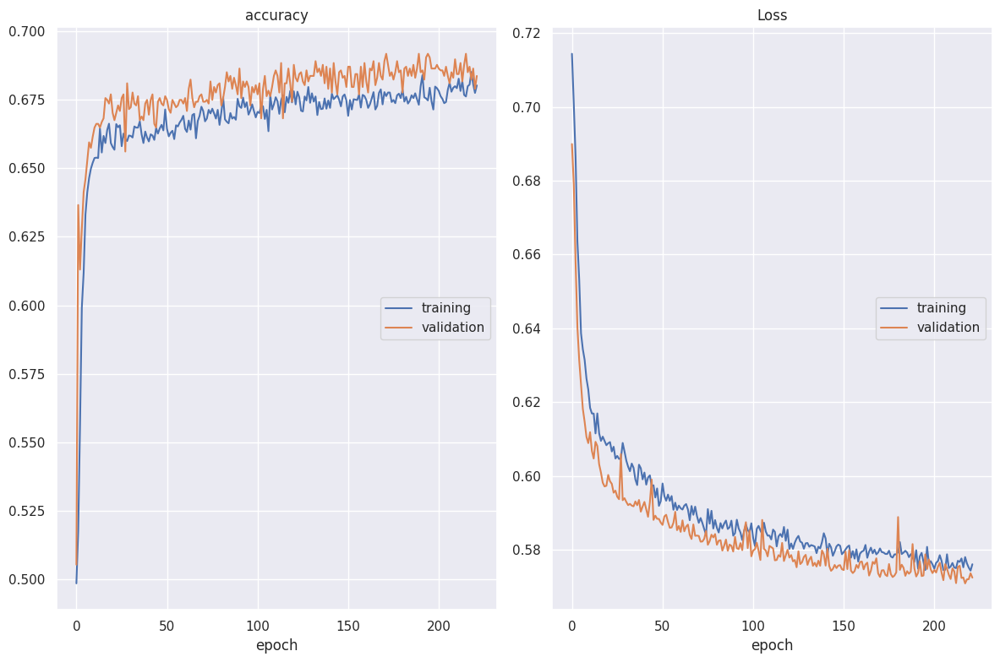

accuracy
	training         	 (min:    0.499, max:    0.685, cur:    0.680)
	validation       	 (min:    0.505, max:    0.692, cur:    0.684)
Loss
	training         	 (min:    0.574, max:    0.714, cur:    0.576)
	validation       	 (min:    0.571, max:    0.690, cur:    0.573)

Epoch 222: val_accuracy did not improve from 0.69179
35/35 [==============================] - 1s 21ms/step - loss: 0.5761 - accuracy: 0.6802 - val_loss: 0.5725 - val_accuracy: 0.6837


In [544]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=200, epochs=300)

#### Prediction and results

Accuracy: 0.6801369863013699
Precision: [0.7057903  0.66017052]
Recall: 0.7424657534246575
F1 score: 0.698904
ROC AUC: 0.680137


(0.6801369863013699,
 array([0.7057903 , 0.66017052]),
 0.7424657534246575,
 0.6989039329464861,
 0.6801369863013699)

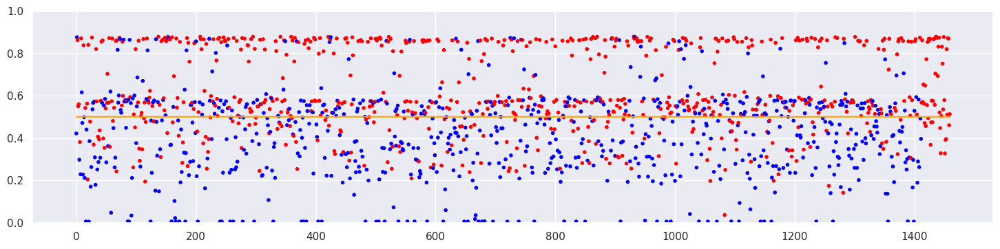

<Figure size 640x480 with 0 Axes>

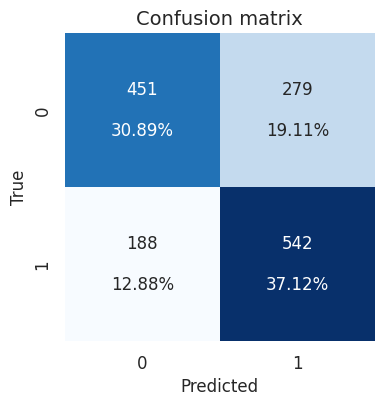

In [545]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=250, epochs=300

#### Create and train model

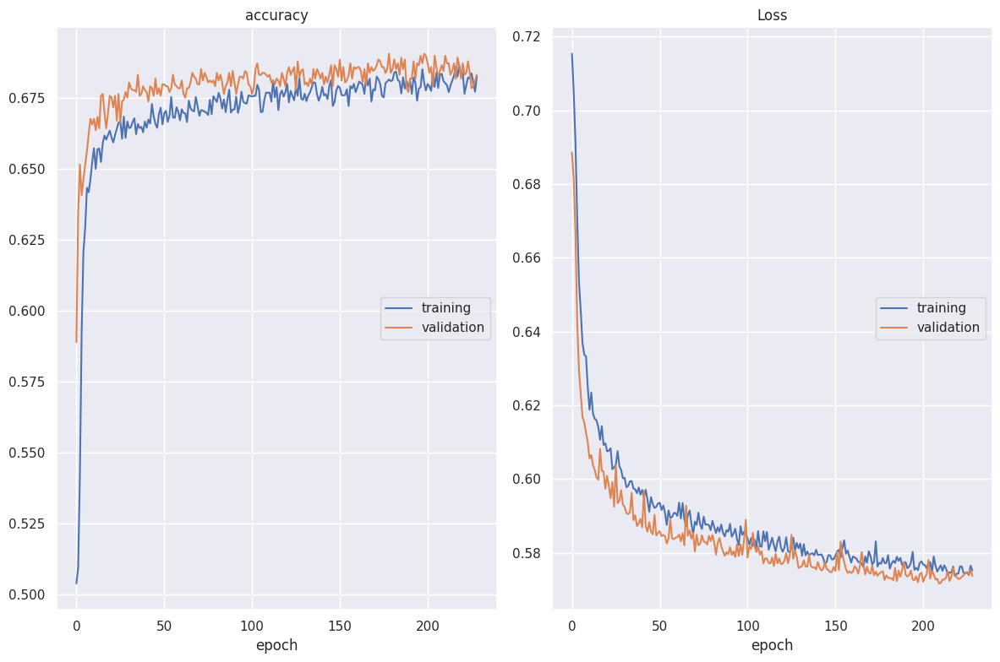

accuracy
	training         	 (min:    0.504, max:    0.686, cur:    0.682)
	validation       	 (min:    0.589, max:    0.690, cur:    0.683)
Loss
	training         	 (min:    0.574, max:    0.715, cur:    0.575)
	validation       	 (min:    0.572, max:    0.689, cur:    0.574)

Epoch 229: val_accuracy did not improve from 0.69044
28/28 [==============================] - 1s 36ms/step - loss: 0.5752 - accuracy: 0.6824 - val_loss: 0.5737 - val_accuracy: 0.6830


In [546]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v1_batch_size_250_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=250, epochs=300)

#### Prediction and results

Accuracy: 0.6753424657534246
Precision: [0.68130312 0.66976127]
Recall: 0.6917808219178082
F1 score: 0.680593
ROC AUC: 0.675342


(0.6753424657534246,
 array([0.68130312, 0.66976127]),
 0.6917808219178082,
 0.6805929919137467,
 0.6753424657534246)

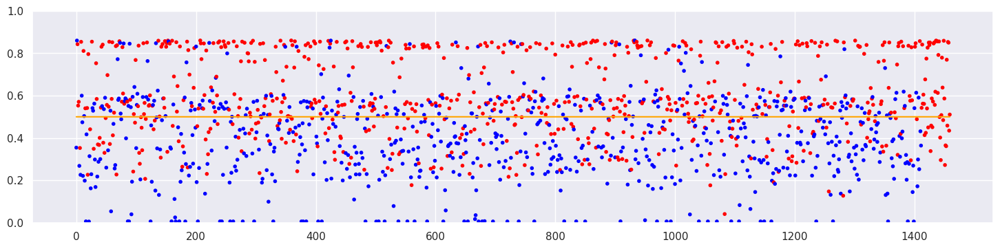

<Figure size 640x480 with 0 Axes>

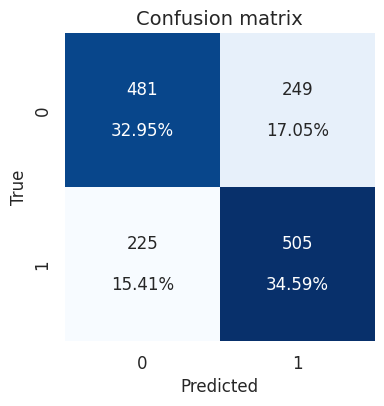

In [547]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### Model 1. - version for data reduced by outliers

### batch_size=10, epochs=300

#### Create and train model

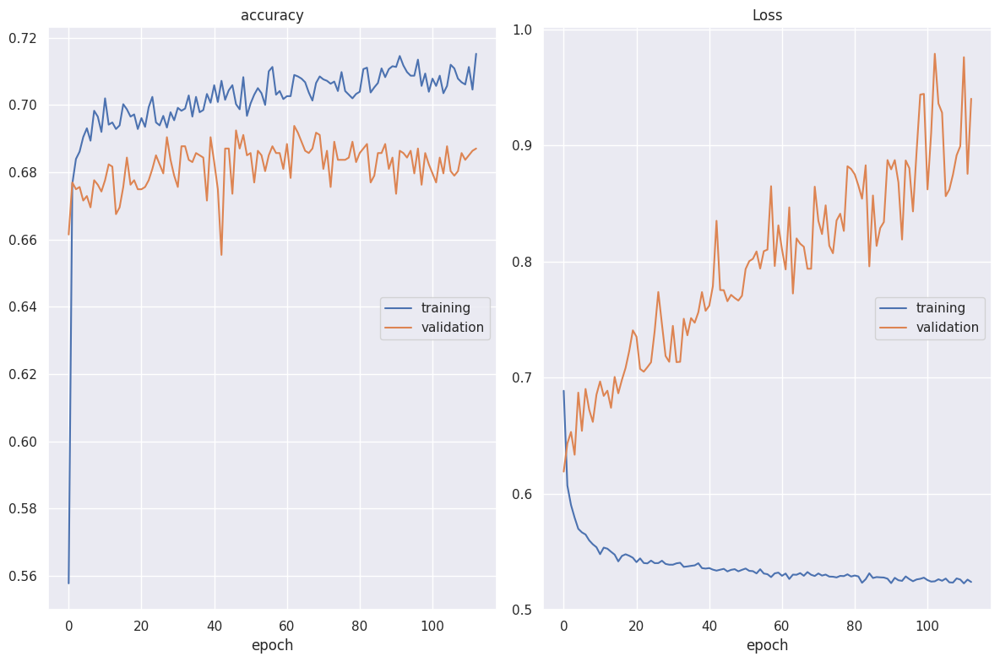

accuracy
	training         	 (min:    0.558, max:    0.715, cur:    0.715)
	validation       	 (min:    0.655, max:    0.694, cur:    0.687)
Loss
	training         	 (min:    0.523, max:    0.689, cur:    0.524)
	validation       	 (min:    0.619, max:    0.979, cur:    0.940)

Epoch 113: val_accuracy did not improve from 0.69381
461/461 [==============================] - 2s 4ms/step - loss: 0.5239 - accuracy: 0.7152 - val_loss: 0.9402 - val_accuracy: 0.6871


In [548]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_10_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=10, epochs=300)

#### Prediction and results

Accuracy: 0.6801369863013699
Precision: [0.67746289 0.68289291]
Recall: 0.6726027397260274
F1 score: 0.677709
ROC AUC: 0.680137


(0.6801369863013699,
 array([0.67746289, 0.68289291]),
 0.6726027397260274,
 0.6777087646652865,
 0.6801369863013698)

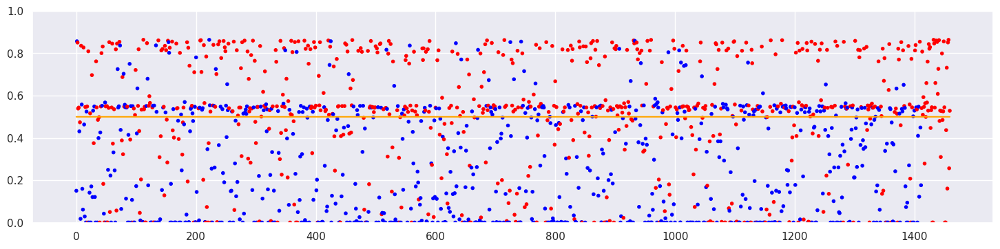

<Figure size 640x480 with 0 Axes>

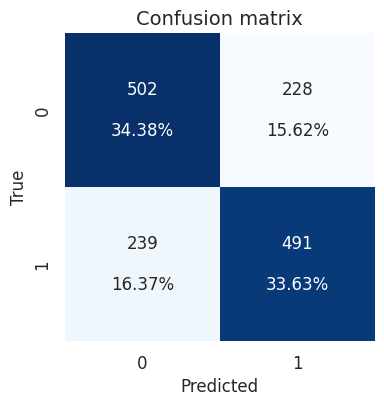

In [549]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=50, epochs=300

#### Create and train model

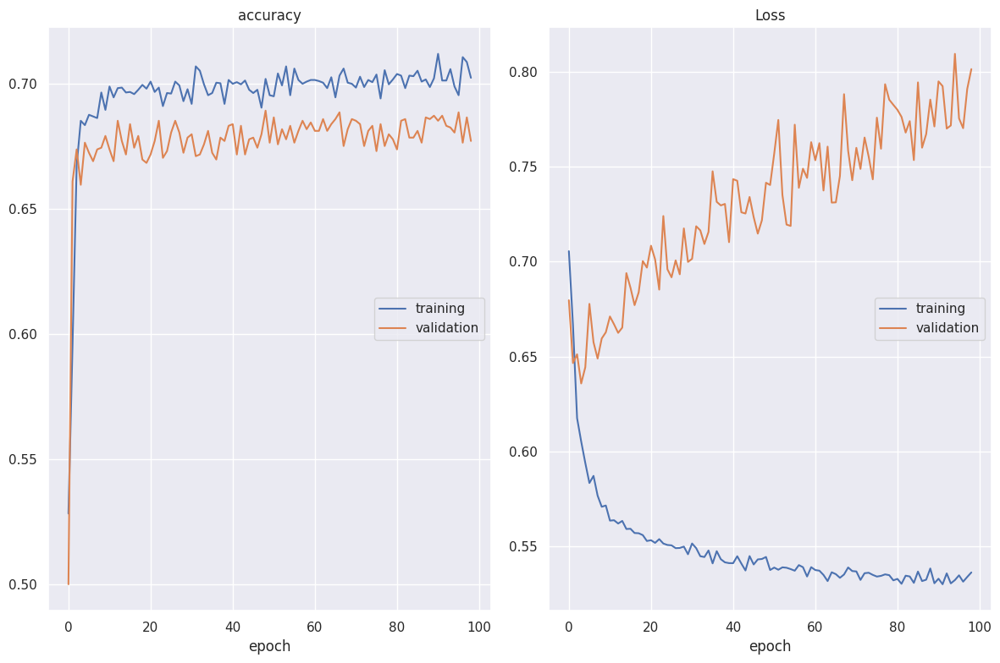

accuracy
	training         	 (min:    0.528, max:    0.712, cur:    0.702)
	validation       	 (min:    0.500, max:    0.689, cur:    0.677)
Loss
	training         	 (min:    0.530, max:    0.706, cur:    0.536)
	validation       	 (min:    0.636, max:    0.809, cur:    0.801)

Epoch 99: val_accuracy did not improve from 0.68910
93/93 [==============================] - 1s 9ms/step - loss: 0.5363 - accuracy: 0.7022 - val_loss: 0.8014 - val_accuracy: 0.6770


In [550]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_50_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=50, epochs=300)

#### Prediction and results

Accuracy: 0.6794520547945205
Precision: [0.67191601 0.68767908]
Recall: 0.6575342465753424
F1 score: 0.672269
ROC AUC: 0.679452


(0.6794520547945205,
 array([0.67191601, 0.68767908]),
 0.6575342465753424,
 0.6722689075630253,
 0.6794520547945205)

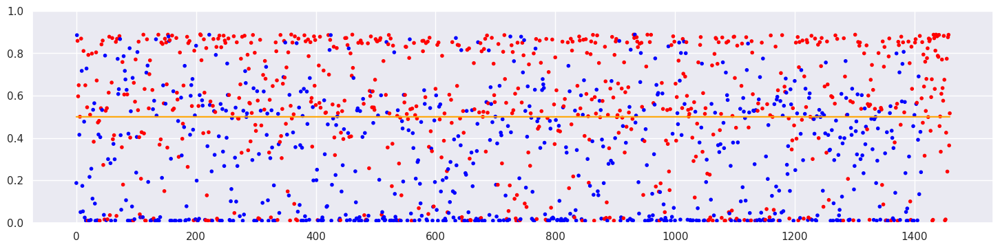

<Figure size 640x480 with 0 Axes>

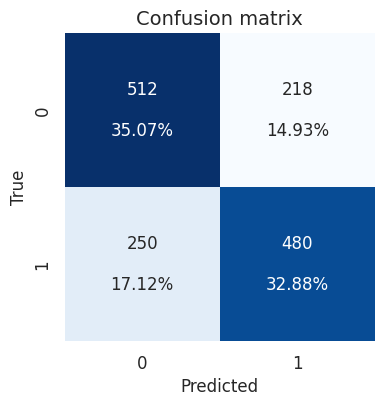

In [551]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=100, epochs=300

#### Create and train model

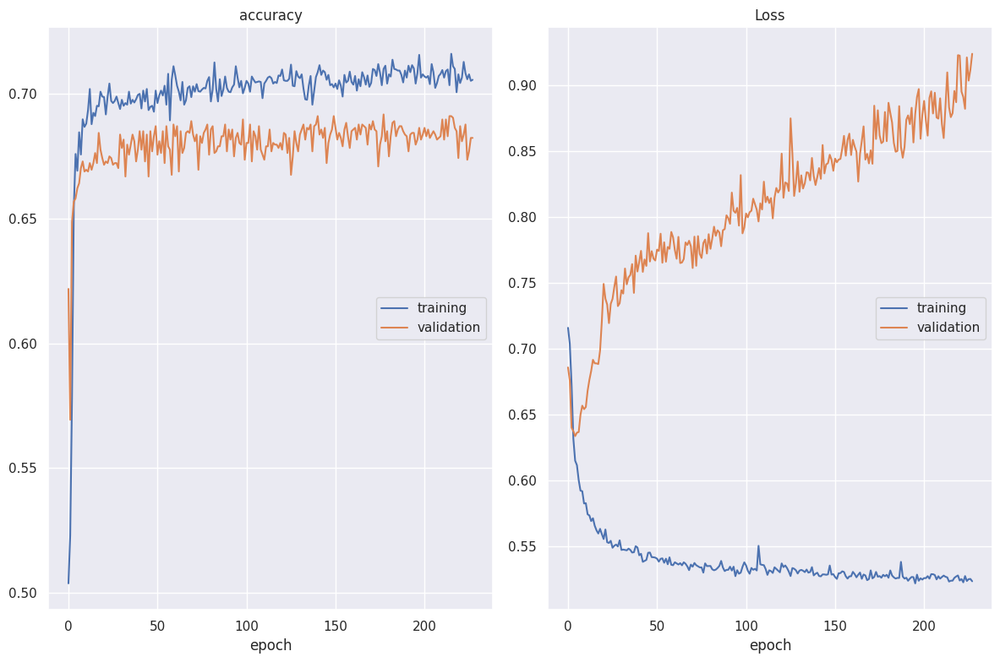

accuracy
	training         	 (min:    0.504, max:    0.716, cur:    0.706)
	validation       	 (min:    0.569, max:    0.692, cur:    0.682)
Loss
	training         	 (min:    0.522, max:    0.716, cur:    0.524)
	validation       	 (min:    0.634, max:    0.924, cur:    0.924)

Epoch 228: val_accuracy did not improve from 0.69179
47/47 [==============================] - 1s 15ms/step - loss: 0.5236 - accuracy: 0.7057 - val_loss: 0.9239 - val_accuracy: 0.6824


In [552]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_100_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=100, epochs=300)

#### Prediction and results

Accuracy: 0.6746575342465754
Precision: [0.68398268 0.66623207]
Recall: 0.7
F1 score: 0.682699
ROC AUC: 0.674658


(0.6746575342465754,
 array([0.68398268, 0.66623207]),
 0.7,
 0.682698730794923,
 0.6746575342465753)

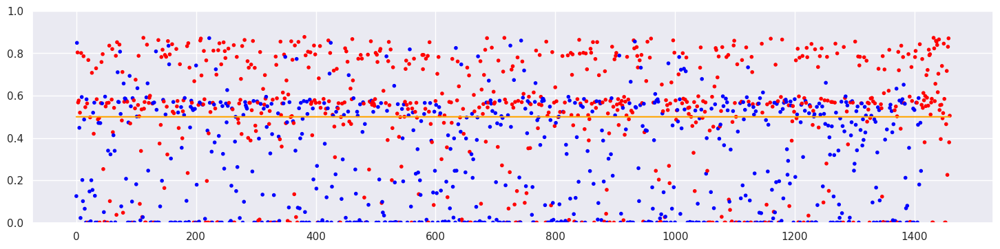

<Figure size 640x480 with 0 Axes>

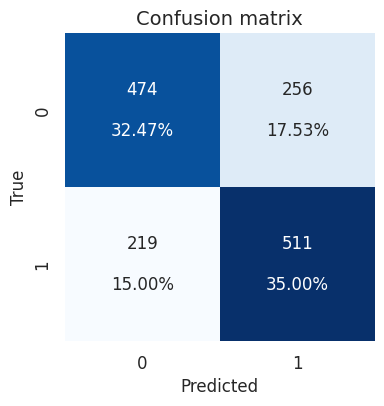

In [553]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=150, epochs=300

#### Create and train model

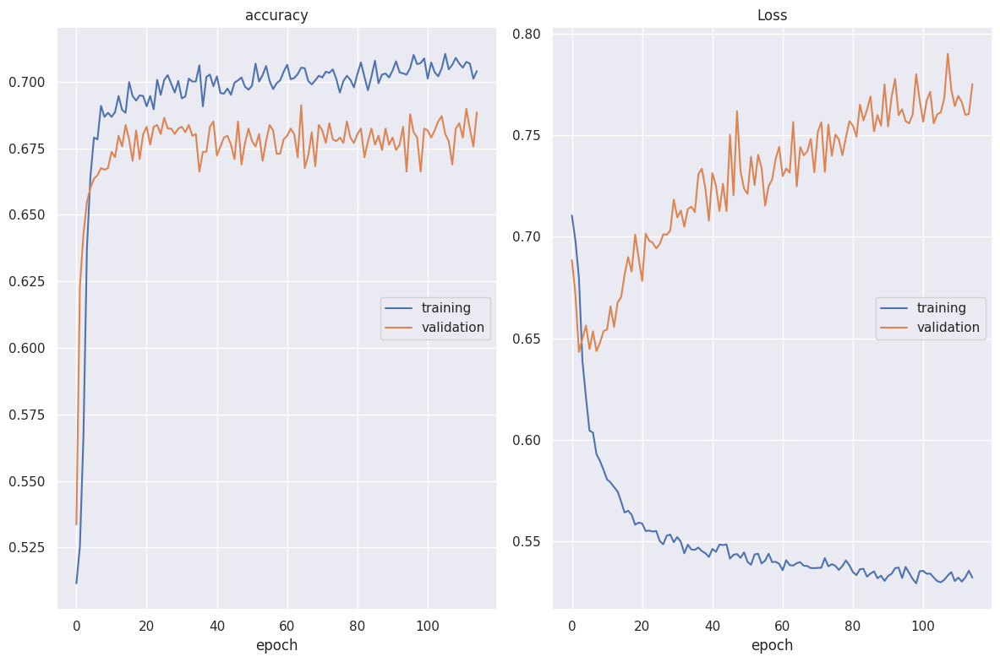

accuracy
	training         	 (min:    0.512, max:    0.710, cur:    0.704)
	validation       	 (min:    0.534, max:    0.691, cur:    0.688)
Loss
	training         	 (min:    0.529, max:    0.711, cur:    0.532)
	validation       	 (min:    0.643, max:    0.790, cur:    0.775)

Epoch 115: val_accuracy did not improve from 0.69112
31/31 [==============================] - 1s 22ms/step - loss: 0.5322 - accuracy: 0.7040 - val_loss: 0.7751 - val_accuracy: 0.6884


In [554]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_150_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=150, epochs=300)

#### Prediction and results

Accuracy: 0.6746575342465754
Precision: [0.67114094 0.67832168]
Recall: 0.6643835616438356
F1 score: 0.671280
ROC AUC: 0.674658


(0.6746575342465754,
 array([0.67114094, 0.67832168]),
 0.6643835616438356,
 0.6712802768166091,
 0.6746575342465754)

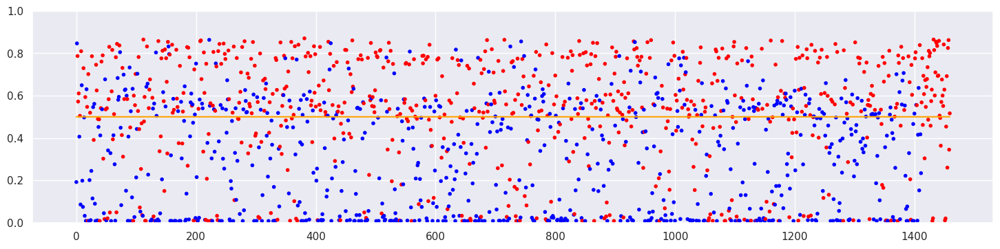

<Figure size 640x480 with 0 Axes>

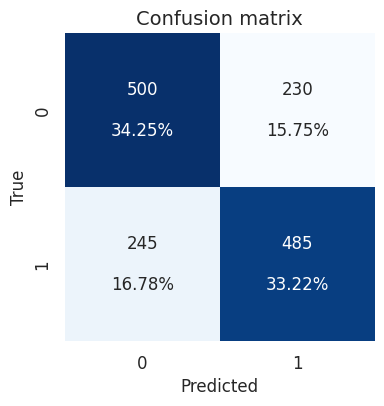

In [555]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=200, epochs=300

#### Create and train model

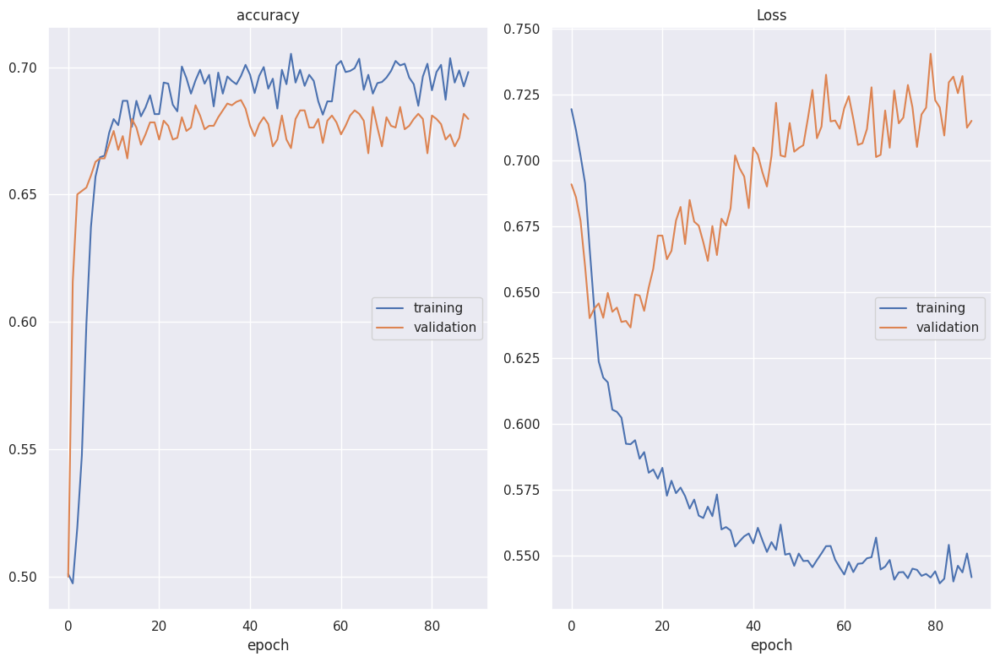

accuracy
	training         	 (min:    0.497, max:    0.705, cur:    0.698)
	validation       	 (min:    0.500, max:    0.687, cur:    0.680)
Loss
	training         	 (min:    0.539, max:    0.720, cur:    0.542)
	validation       	 (min:    0.637, max:    0.741, cur:    0.715)

Epoch 89: val_accuracy did not improve from 0.68708
24/24 [==============================] - 1s 29ms/step - loss: 0.5418 - accuracy: 0.6981 - val_loss: 0.7151 - val_accuracy: 0.6797


In [556]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=200, epochs=300)

#### Prediction and results

Accuracy: 0.673972602739726
Precision: [0.67887324 0.66933333]
Recall: 0.6876712328767123
F1 score: 0.678378
ROC AUC: 0.673973


(0.673972602739726,
 array([0.67887324, 0.66933333]),
 0.6876712328767123,
 0.6783783783783783,
 0.6739726027397261)

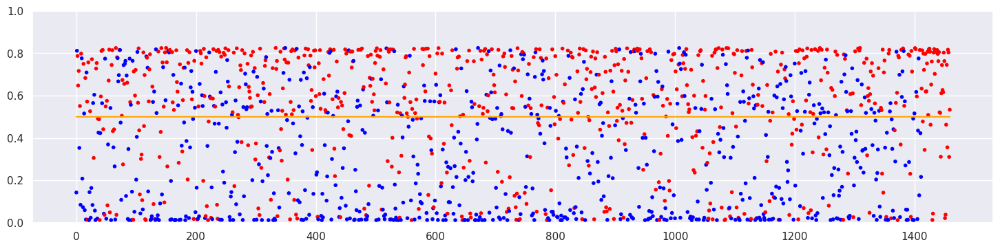

<Figure size 640x480 with 0 Axes>

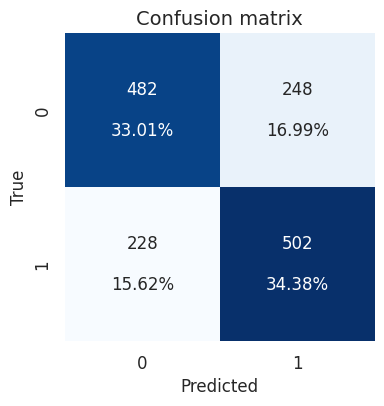

In [557]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=250, epochs=300

#### Create and train model

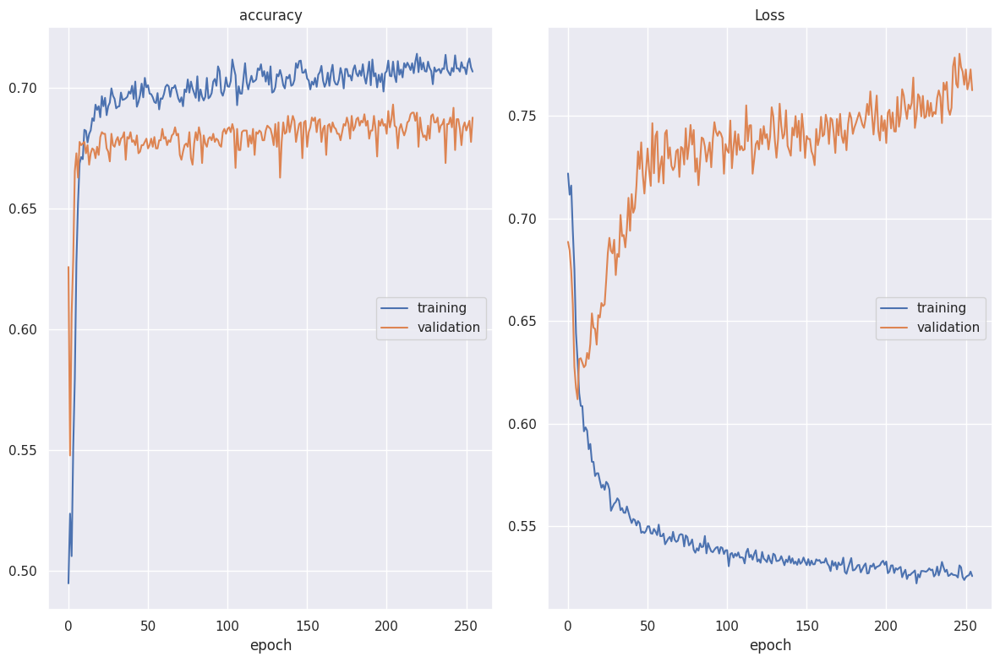

accuracy
	training         	 (min:    0.495, max:    0.714, cur:    0.707)
	validation       	 (min:    0.548, max:    0.693, cur:    0.688)
Loss
	training         	 (min:    0.522, max:    0.722, cur:    0.526)
	validation       	 (min:    0.612, max:    0.780, cur:    0.762)

Epoch 255: val_accuracy did not improve from 0.69314
19/19 [==============================] - 1s 45ms/step - loss: 0.5258 - accuracy: 0.7068 - val_loss: 0.7624 - val_accuracy: 0.6878


In [558]:
model_name = 'model_users_only_10000_with_location_mapped_to_country_1_v2_wo_outliers_batch_size_250_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=250, epochs=300)

#### Prediction and results

Accuracy: 0.6808219178082192
Precision: [0.67506631 0.68696884]
Recall: 0.6643835616438356
F1 score: 0.675487
ROC AUC: 0.680822


(0.6808219178082192,
 array([0.67506631, 0.68696884]),
 0.6643835616438356,
 0.6754874651810585,
 0.6808219178082192)

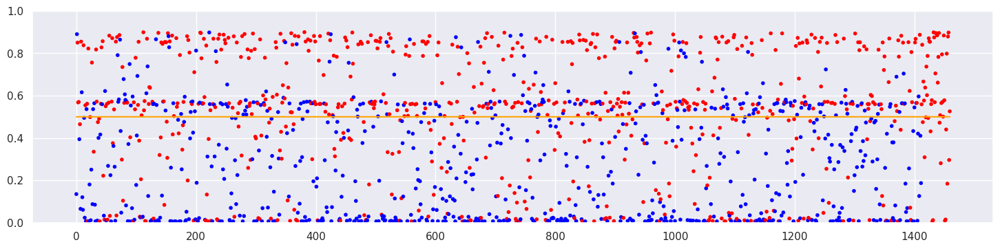

<Figure size 640x480 with 0 Axes>

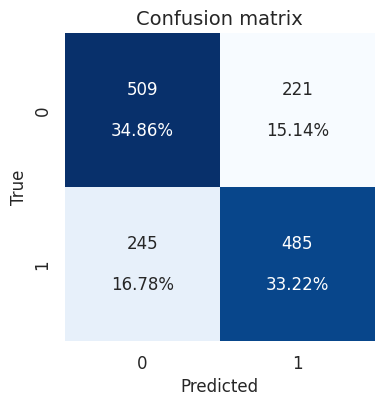

In [559]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)